# **Delivery-Time Prediction**

## **Import Library**

In [2]:
# Install library yang dibutuhkan
!pip install scipy
!pip install dalex
!pip install shap
!pip install lime
!pip install catboost
!pip install joblib

In [3]:
# load pandas untuk data wrangling
import pandas as pd
# load numpy untuk manipulasi vektor
import numpy as np
# load matplotlib untuk visualisasi data
import matplotlib.pyplot as plt
# load seaborn untuk visualisasi data
import seaborn as sns

# load metrics object dari sklearn
from sklearn import metrics
# load train-test data splitter
from sklearn.model_selection import train_test_split
# load scaler
from sklearn.preprocessing import StandardScaler
# load encoder
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
# load model catboost
from catboost import CatBoostRegressor
# load model regresi linier dan regularisasi
from sklearn.linear_model import LinearRegression, Ridge, Lasso
# load decison tree regression
from sklearn.tree import DecisionTreeRegressor
# load random forest dan gradient boosting
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
# load MLP Regressor
from sklearn.neural_network import MLPRegressor
# load metrik untuk regresi
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
# load xgboost
import xgboost as xgb
# load lightbgm
import lightgbm as lgb

# load GridSearchCV
from sklearn.model_selection import GridSearchCV
# load encoder
from sklearn.preprocessing import OneHotEncoder
# load dalex untuk interpretability
import dalex as dx
# load warnings
import warnings
# load geopy untuk menghitung jarak geografis
from geopy.distance import geodesic
# load datetime untuk manipulasi waktu dan tanggal
from datetime import datetime, timedelta
# load SimpleImputer untuk mengisi missing value
from sklearn.impute import SimpleImputer
# load joblib untuk menyimpan dan memuat model/encoder/scaler
import joblib


%matplotlib inline
warnings.filterwarnings("ignore")
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

## **Load Dataset**

In [4]:
dataset = pd.read_csv('Zomato Dataset.csv')

## **Overview Data**

In [5]:
df = dataset.copy()

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45584 entries, 0 to 45583
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           45584 non-null  object 
 1   Delivery_person_ID           45584 non-null  object 
 2   Delivery_person_Age          43730 non-null  float64
 3   Delivery_person_Ratings      43676 non-null  float64
 4   Restaurant_latitude          45584 non-null  float64
 5   Restaurant_longitude         45584 non-null  float64
 6   Delivery_location_latitude   45584 non-null  float64
 7   Delivery_location_longitude  45584 non-null  float64
 8   Order_Date                   45584 non-null  object 
 9   Time_Orderd                  43853 non-null  object 
 10  Time_Order_picked            45584 non-null  object 
 11  Weather_conditions           44968 non-null  object 
 12  Road_traffic_density         44983 non-null  object 
 13  Vehicle_conditio

In [7]:
df.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min)
0,0xcdcd,DEHRES17DEL01,36.0,4.2,30.327968,78.046106,30.397968,78.116106,12-02-2022,21:55,22:10,Fog,Jam,2,Snack,motorcycle,3.0,No,Metropolitian,46
1,0xd987,KOCRES16DEL01,21.0,4.7,10.003064,76.307589,10.043064,76.347589,13-02-2022,14:55,15:05,Stormy,High,1,Meal,motorcycle,1.0,No,Metropolitian,23
2,0x2784,PUNERES13DEL03,23.0,4.7,18.562450,73.916619,18.652450,74.006619,04-03-2022,17:30,17:40,Sandstorms,Medium,1,Drinks,scooter,1.0,No,Metropolitian,21
3,0xc8b6,LUDHRES15DEL02,34.0,4.3,30.899584,75.809346,30.919584,75.829346,13-02-2022,09:20,09:30,Sandstorms,Low,0,Buffet,motorcycle,0.0,No,Metropolitian,20
4,0xdb64,KNPRES14DEL02,24.0,4.7,26.463504,80.372929,26.593504,80.502929,14-02-2022,19:50,20:05,Fog,Jam,1,Snack,scooter,1.0,No,Metropolitian,41


### Handing Sensitive Data

Dataset ini memiliki dua komponen yang penting dan sensitif yakni, waktu dan lokasi geografis. Karena keduanya sangat berpengaruh terhadap analisis dan hasil prediksi, maka sebelum pengolahan lebih lanjut, perlu dipastikan bahwa kedua komponen ini sudah dalam kondisi yang valid.

#### Time

Dalam dataset ini, informasi waktu seperti jam pemesanan dan jam penjemputan sangat penting. Jika format waktunya tidak sesuai atau nilainya tidak valid, maka data tersebut tidak bisa diandalkan dan tidak layak digunakan untuk analisis. Karena waktu tidak bisa diisi sembarangan atau diimputasi seenaknya, maka solusi terbaik adalah menghapus baris data yang tidak valid

In [8]:
# Mengubah 'Order_Date' ke datetime
df['Order_Date'] = pd.to_datetime(df['Order_Date'], format='%d-%m-%Y')

In [9]:
def is_valid_time_format(val):
    try:
        datetime.strptime(str(val).strip(), "%H:%M")
        return True
    except:
        return False

# Terapkan ke kedua kolom
valid_order_time = df['Time_Orderd'].apply(is_valid_time_format)
valid_picked_time = df['Time_Order_picked'].apply(is_valid_time_format)

# Hanya ambil baris yang valid di kedua kolom
df = df[valid_order_time & valid_picked_time].copy()

In [10]:
df['Time_Orderd'] = df['Time_Orderd'].apply(lambda x: datetime.strptime(x.strip(), "%H:%M").time())
df['Time_Order_picked'] = df['Time_Order_picked'].apply(lambda x: datetime.strptime(x.strip(), "%H:%M").time())

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 35407 entries, 0 to 45583
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   ID                           35407 non-null  object        
 1   Delivery_person_ID           35407 non-null  object        
 2   Delivery_person_Age          35234 non-null  float64       
 3   Delivery_person_Ratings      35194 non-null  float64       
 4   Restaurant_latitude          35407 non-null  float64       
 5   Restaurant_longitude         35407 non-null  float64       
 6   Delivery_location_latitude   35407 non-null  float64       
 7   Delivery_location_longitude  35407 non-null  float64       
 8   Order_Date                   35407 non-null  datetime64[ns]
 9   Time_Orderd                  35407 non-null  object        
 10  Time_Order_picked            35407 non-null  object        
 11  Weather_conditions           35407 non-null  o

In [12]:
df.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min)
0,0xcdcd,DEHRES17DEL01,36.0,4.2,30.327968,78.046106,30.397968,78.116106,2022-02-12,21:55:00,22:10:00,Fog,Jam,2,Snack,motorcycle,3.0,No,Metropolitian,46
1,0xd987,KOCRES16DEL01,21.0,4.7,10.003064,76.307589,10.043064,76.347589,2022-02-13,14:55:00,15:05:00,Stormy,High,1,Meal,motorcycle,1.0,No,Metropolitian,23
2,0x2784,PUNERES13DEL03,23.0,4.7,18.562450,73.916619,18.652450,74.006619,2022-03-04,17:30:00,17:40:00,Sandstorms,Medium,1,Drinks,scooter,1.0,No,Metropolitian,21
3,0xc8b6,LUDHRES15DEL02,34.0,4.3,30.899584,75.809346,30.919584,75.829346,2022-02-13,09:20:00,09:30:00,Sandstorms,Low,0,Buffet,motorcycle,0.0,No,Metropolitian,20
4,0xdb64,KNPRES14DEL02,24.0,4.7,26.463504,80.372929,26.593504,80.502929,2022-02-14,19:50:00,20:05:00,Fog,Jam,1,Snack,scooter,1.0,No,Metropolitian,41


#### Geografis

Informasi lokasi (latitude dan longitude) juga sangat penting karena menentukan jarak tempuh, rute, dan waktu pengantaran. Jika data lokasi tidak valid, seperti koordinat yang bernilai negatif padahal seharusnya positif, maka perlu diperbaiki dengan cara yang logis (misalnya mengubah nilai negatif jadi positif bila memang jelas kesalahannya). Sama seperti waktu, data lokasi tidak bisa diisi secara acak karena berdampak langsung pada kualitas analisis

In [13]:
# Daftar kolom yang dianalisis
columns = ['Restaurant_latitude', 'Restaurant_longitude', 'Delivery_location_latitude', 'Delivery_location_longitude']

# Hitung nilai minimum dan maksimum
summary_stats = pd.DataFrame({
    'Feature': columns,
    'Min Value': df[columns].min().values,
    'Max Value': df[columns].max().values
})

# Tampilkan dalam bentuk tabel
print(summary_stats.to_string(index=False))

                    Feature  Min Value  Max Value
        Restaurant_latitude -30.902872  30.914057
       Restaurant_longitude   0.000000  88.433452
 Delivery_location_latitude   0.010000  31.045562
Delivery_location_longitude   0.010000  88.563452


In [14]:
# Melihat nilai latitude dari restaurant
df['Restaurant_latitude'].value_counts()

Restaurant_latitude
 0.000000     2817
 26.911378     148
 26.913726     145
 26.888420     145
 26.892312     143
 26.914142     142
 26.902328     140
 26.902908     140
 26.766536     139
 22.308096     138
 26.913483     137
 21.173493     137
 17.431668     137
 12.979166     136
 22.725748     135
 13.058616     135
 26.902940     135
 13.029198     135
 11.025083     134
 12.308500     134
 22.744648     133
 13.029780     133
 12.337978     133
 21.170096     133
 12.323978     133
 12.978453     133
 12.933284     133
 12.323194     133
 13.005801     132
 11.022477     132
 11.008638     132
 17.431477     132
 12.933298     132
 17.422819     132
 17.459710     132
 23.357804     132
 21.183434     131
 21.186438     131
 26.846156     131
 26.956431     131
 21.157735     131
 12.979096     131
 17.483216     131
 17.451976     131
 17.429585     131
 26.891191     130
 17.410371     130
 26.913987     130
 17.430448     130
 26.905287     130
 22.312790     130
 11.003008 

Dapat dilihat dari 'Delivery_location_latitude' bahwa latitude seharusnya bernilai positif semua. Walaupun latitude dapat bernilai negatif, tetap dalam dataset ini (food delivery), nilai negatif tidaklah wajar. Dengan asumsi bahwa nilai latitude negatif dikarenakan salah input, maka nilai latitude yang negatif akan diubah menjadi positif.

In [15]:
# Mengubah nilai latitude menjadi positif
df.loc[df['Restaurant_latitude'] < 0, 'Restaurant_latitude'] *= -1

In [16]:
# Daftar kolom yang dianalisis
columns = ['Restaurant_latitude', 'Restaurant_longitude', 'Delivery_location_latitude', 'Delivery_location_longitude']

# Hitung nilai minimum dan maksimum
summary_stats = pd.DataFrame({
    'Feature': columns,
    'Min Value': df[columns].min().values,
    'Max Value': df[columns].max().values
})

# Tampilkan dalam bentuk tabel
print(summary_stats.to_string(index=False))

                    Feature  Min Value  Max Value
        Restaurant_latitude       0.00  30.914057
       Restaurant_longitude       0.00  88.433452
 Delivery_location_latitude       0.01  31.045562
Delivery_location_longitude       0.01  88.563452


### Add New Feature

In [17]:
# Fungsi untuk mengubah time-only jadi datetime
def to_datetime_from_time(t):
    #Updated the format string to  "%Y-%m-%d %H:%M:%S" to handle seconds
    return datetime.strptime(f"2000-01-01 {t}", "%Y-%m-%d %H:%M:%S")

# Membuat kolom baru dengan format datetime
df['Time_Ordered_dt'] = df['Time_Orderd'].apply(to_datetime_from_time)
df['Time_Picked_dt'] = df['Time_Order_picked'].apply(to_datetime_from_time)

# Jika Time_Picked lebih kecil dari Time_Ordered (misal: pesanan 23:59, pickup 00:10), anggap pickup keesokan harinya
df['Time_Picked_dt'] = df.apply(
    lambda row: row['Time_Picked_dt'] + timedelta(days=1) if row['Time_Picked_dt'] < row['Time_Ordered_dt'] else row['Time_Picked_dt'],
    axis=1
)


In [18]:
# Membuat fitur untuk melihat waktu yang dibutuhkan untuk Pickup
df['Pickup_Delay'] = (df['Time_Picked_dt'] - df['Time_Ordered_dt']).dt.total_seconds() / 60.0

In [19]:
# Membuat fitur untuk melihat jam order dan hari order
df['Order_Hour'] = df['Time_Ordered_dt'].dt.hour
df['Order_Day'] = df['Order_Date'].dt.day_name()

In [20]:
# Membuat fitur untuk menghitung jarak geografis

def haversine(row):
    return geodesic(
        (row['Restaurant_latitude'], row['Restaurant_longitude']),
        (row['Delivery_location_latitude'], row['Delivery_location_longitude'])
    ).km

df['Distance_km'] = df.apply(haversine, axis=1)

In [21]:
df.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min),Time_Ordered_dt,Time_Picked_dt,Pickup_Delay,Order_Hour,Order_Day,Distance_km
0,0xcdcd,DEHRES17DEL01,36.0,4.2,30.327968,78.046106,30.397968,78.116106,2022-02-12,21:55:00,22:10:00,Fog,Jam,2,Snack,motorcycle,3.0,No,Metropolitian,46,2000-01-01 21:55:00,2000-01-01 22:10:00,15.0,21,Saturday,10.271464
1,0xd987,KOCRES16DEL01,21.0,4.7,10.003064,76.307589,10.043064,76.347589,2022-02-13,14:55:00,15:05:00,Stormy,High,1,Meal,motorcycle,1.0,No,Metropolitian,23,2000-01-01 14:55:00,2000-01-01 15:05:00,10.0,14,Sunday,6.229376
2,0x2784,PUNERES13DEL03,23.0,4.7,18.562450,73.916619,18.652450,74.006619,2022-03-04,17:30:00,17:40:00,Sandstorms,Medium,1,Drinks,scooter,1.0,No,Metropolitian,21,2000-01-01 17:30:00,2000-01-01 17:40:00,10.0,17,Friday,13.764306
3,0xc8b6,LUDHRES15DEL02,34.0,4.3,30.899584,75.809346,30.919584,75.829346,2022-02-13,09:20:00,09:30:00,Sandstorms,Low,0,Buffet,motorcycle,0.0,No,Metropolitian,20,2000-01-01 09:20:00,2000-01-01 09:30:00,10.0,9,Sunday,2.927795
4,0xdb64,KNPRES14DEL02,24.0,4.7,26.463504,80.372929,26.593504,80.502929,2022-02-14,19:50:00,20:05:00,Fog,Jam,1,Snack,scooter,1.0,No,Metropolitian,41,2000-01-01 19:50:00,2000-01-01 20:05:00,15.0,19,Monday,19.373484


### Check Missing Value

In [22]:
df.isna().sum()

ID                               0
Delivery_person_ID               0
Delivery_person_Age            173
Delivery_person_Ratings        213
Restaurant_latitude              0
Restaurant_longitude             0
Delivery_location_latitude       0
Delivery_location_longitude      0
Order_Date                       0
Time_Orderd                      0
Time_Order_picked                0
Weather_conditions               0
Road_traffic_density             0
Vehicle_condition                0
Type_of_order                    0
Type_of_vehicle                  0
multiple_deliveries            763
Festival                       175
City                           920
Time_taken (min)                 0
Time_Ordered_dt                  0
Time_Picked_dt                   0
Pickup_Delay                     0
Order_Hour                       0
Order_Day                        0
Distance_km                      0
dtype: int64

In [23]:
cat = df.select_dtypes(include=['object']).columns

for column in cat:
    print(f"============= {column} =================")
    display(df[column].value_counts())
    print()

============= ID =================


ID
0x5fb2    1
0xcdcd    1
0xd987    1
0x2784    1
0xc8b6    1
0xdb64    1
0x3af3    1
0x3aab    1
0x689b    1
0x6f67    1
0xc9cf    1
0x36b8    1
0x5795    1
0x6c6b    1
0xb816    1
0x1a92    1
0x1b0d    1
0xc7a7    1
0x1de4    1
0xaec7    1
0xe2c     1
0x2601    1
0x5af4    1
0x2ee7    1
0xd5c3    1
0xb55b    1
0x491a    1
0xa810    1
0x7328    1
0xbd47    1
0x1523    1
0xbe80    1
0x73cc    1
0x8aa2    1
0x395b    1
0xb002    1
0x8e6c    1
0x3da1    1
0x7ac8    1
0xc1ff    1
0x25fd    1
0x5554    1
0x3556    1
0xa30b    1
0x6999    1
0x85b4    1
0xb796    1
0x156b    1
0x34d7    1
0x1fb7    1
0xc444    1
0x2dc6    1
0xb962    1
0xc606    1
0x1a70    1
0x5ded    1
0xbbde    1
0x8b53    1
0xa258    1
0x273a    1
0x98aa    1
0xd255    1
0x1609    1
0x4863    1
0x2558    1
0x1236    1
0x4161    1
0xa3e0    1
0x97e3    1
0xb437    1
0x35e6    1
0x6d19    1
0x8195    1
0x95fb    1
0x1d60    1
0xc19e    1
0xcbc4    1
0x837c    1
0x56ad    1
0x99e7    1
0x2bc0    1
0xadb4    1
0x3ec5    1
0


============= Delivery_person_ID =================


Delivery_person_ID
SURRES11DEL01        57
VADRES11DEL02        57
JAPRES03DEL01        56
JAPRES09DEL02        56
JAPRES14DEL02        56
VADRES12DEL02        55
JAPRES19DEL02        55
MUMRES01DEL01        55
BANGRES07DEL02       54
BANGRES14DEL01       54
JAPRES17DEL01        54
PUNERES01DEL01       54
BANGRES03DEL01       53
CHENRES04DEL02       53
INDORES08DEL02       53
BANGRES16DEL02       53
SURRES15DEL02        53
BANGRES09DEL01       53
VADRES14DEL01        53
MUMRES19DEL02        53
MYSRES15DEL01        53
INDORES010DEL01      53
BANGRES010DEL02      53
JAPRES11DEL02        52
HYDRES19DEL01        52
CHENRES01DEL02       52
BANGRES06DEL01       52
RANCHIRES02DEL01     52
COIMBRES010DEL02     52
SURRES04DEL02        52
JAPRES02DEL01        52
MYSRES14DEL01        52
MYSRES04DEL02        52
RANCHIRES16DEL01     52
SURRES01DEL02        52
RANCHIRES13DEL01     52
COIMBRES03DEL01      51
HYDRES15DEL01        51
CHENRES07DEL01       51
HYDRES09DEL01        51
HYDRES04DEL02        


============= Time_Orderd =================


Time_Orderd
22:20:00    448
21:35:00    446
21:15:00    442
21:20:00    437
18:35:00    436
21:25:00    435
18:10:00    435
17:35:00    435
23:30:00    434
22:10:00    434
17:40:00    431
17:25:00    431
23:25:00    429
21:40:00    429
22:35:00    428
18:20:00    425
17:15:00    424
21:10:00    423
20:40:00    423
23:35:00    422
18:30:00    421
19:25:00    420
23:40:00    419
19:30:00    419
20:35:00    416
19:40:00    416
20:20:00    416
17:20:00    414
23:10:00    414
19:15:00    413
20:30:00    412
19:35:00    412
17:10:00    412
18:40:00    411
22:30:00    410
19:10:00    407
20:15:00    405
22:40:00    405
22:25:00    403
23:20:00    403
18:25:00    400
19:20:00    399
20:10:00    399
18:15:00    398
21:30:00    392
22:15:00    385
20:25:00    385
17:30:00    377
23:15:00    359
21:55:00    312
17:55:00    311
22:45:00    307
19:50:00    295
17:50:00    294
20:50:00    292
22:50:00    290
21:45:00    288
19:55:00    287
20:45:00    281
18:45:00    275
17:45:00    274
19:45:00    


============= Time_Order_picked =================


Time_Order_picked
21:30:00    483
22:50:00    453
21:45:00    445
17:55:00    442
18:40:00    441
22:25:00    441
23:50:00    438
22:40:00    437
23:35:00    434
20:50:00    434
21:55:00    431
18:45:00    430
18:25:00    428
19:55:00    427
19:40:00    426
19:35:00    425
17:35:00    423
20:40:00    421
17:45:00    421
20:55:00    420
20:30:00    418
19:50:00    417
23:45:00    416
17:25:00    416
21:50:00    416
20:25:00    415
18:50:00    411
17:50:00    410
17:30:00    410
19:25:00    409
19:30:00    409
22:45:00    409
21:40:00    409
22:30:00    409
17:40:00    407
21:35:00    406
22:55:00    406
23:25:00    405
18:30:00    403
23:30:00    401
18:35:00    401
18:55:00    401
20:35:00    400
20:45:00    395
22:35:00    395
23:40:00    393
21:25:00    389
23:55:00    387
19:45:00    378
18:05:00    299
23:05:00    295
17:20:00    287
21:20:00    283
20:05:00    280
22:05:00    278
18:20:00    275
21:05:00    271
19:20:00    261
22:20:00    259
20:20:00    256
19:05:00    240
23:20:


============= Weather_conditions =================


Weather_conditions
Fog           5985
Stormy        5976
Sandstorms    5899
Windy         5898
Cloudy        5868
Sunny         5781
Name: count, dtype: int64


============= Road_traffic_density =================


Road_traffic_density
Low       11874
Jam       11293
Medium     8783
High       3457
Name: count, dtype: int64


============= Type_of_order =================


Type_of_order
Snack     8950
Meal      8875
Drinks    8868
Buffet    8714
Name: count, dtype: int64


============= Type_of_vehicle =================


Type_of_vehicle
motorcycle          20753
scooter             11797
electric_scooter     2857
Name: count, dtype: int64


============= Festival =================


Festival
No     34535
Yes      697
Name: count, dtype: int64


============= City =================


City
Metropolitian    26476
Urban             7875
Semi-Urban         136
Name: count, dtype: int64


============= Order_Day =================


Order_Day
Wednesday    5494
Friday       5391
Thursday     4948
Saturday     4925
Tuesday      4923
Sunday       4897
Monday       4829
Name: count, dtype: int64

In [24]:
# Cek persentase missing values
missing_percentage = (df.isnull().sum() / len(df)) * 100

print(missing_percentage[missing_percentage > 0])

Delivery_person_Age        0.488604
Delivery_person_Ratings    0.601576
multiple_deliveries        2.154941
Festival                   0.494253
City                       2.598356
dtype: float64


Terdapat missing value. Persentase missing value < 20%, sehingga tidak akan ada kolom yang di-drop. Missing value handling akan dilakukan setelah split data.

### Check Duplicate

In [25]:
df.duplicated().sum()

np.int64(0)

No duplicated data

## **Train-Test Split**

In [26]:
# Memisahkan fitur (X) dan target label (y)
X = df.drop(['Time_taken (min)'], axis = 1)
y = df['Time_taken (min)']

In [27]:
# Splitting dataset (75:25)
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.25,
    random_state=96
)

print(f"Training set: {X_train.shape}, Testing set: {X_test.shape}")

Training set: (26555, 25), Testing set: (8852, 25)


## **Missing Value Handling**

In [28]:
# Kolom numerik dan kategorikal yang mengandung missing value
num_missing = ['Delivery_person_Age', 'Delivery_person_Ratings', 'multiple_deliveries']
cat_missing = ['Festival', 'City']

In [29]:
# Imputer
num_imputer = SimpleImputer(strategy='median')
cat_imputer = SimpleImputer(strategy='most_frequent')

In [30]:
# Mengimputasi fitur numerik
X_train_num = pd.DataFrame(num_imputer.fit_transform(X_train[num_missing]), columns=num_missing)
X_test_num = pd.DataFrame(num_imputer.transform(X_test[num_missing]), columns=num_missing)

# Mengimputasi fitur kategorikal
X_train_cat = pd.DataFrame(cat_imputer.fit_transform(X_train[cat_missing]), columns=cat_missing)
X_test_cat  = pd.DataFrame(cat_imputer.transform(X_test[cat_missing]), columns=cat_missing)

# Menggabungkan hasil imputasi dengan dataset awal
other_cols = [col for col in X.columns if col not in num_missing + cat_missing]
X_train_other = X_train[other_cols].reset_index(drop=True)
X_test_other = X_test[other_cols].reset_index(drop=True)
X_train = pd.concat([X_train_num, X_train_cat, X_train_other], axis=1)
X_test = pd.concat([X_test_num, X_test_cat, X_test_other], axis=1)


In [31]:
X_train.isna().sum()

Delivery_person_Age            0
Delivery_person_Ratings        0
multiple_deliveries            0
Festival                       0
City                           0
ID                             0
Delivery_person_ID             0
Restaurant_latitude            0
Restaurant_longitude           0
Delivery_location_latitude     0
Delivery_location_longitude    0
Order_Date                     0
Time_Orderd                    0
Time_Order_picked              0
Weather_conditions             0
Road_traffic_density           0
Vehicle_condition              0
Type_of_order                  0
Type_of_vehicle                0
Time_Ordered_dt                0
Time_Picked_dt                 0
Pickup_Delay                   0
Order_Hour                     0
Order_Day                      0
Distance_km                    0
dtype: int64

In [32]:
X_test.isna().sum()

Delivery_person_Age            0
Delivery_person_Ratings        0
multiple_deliveries            0
Festival                       0
City                           0
ID                             0
Delivery_person_ID             0
Restaurant_latitude            0
Restaurant_longitude           0
Delivery_location_latitude     0
Delivery_location_longitude    0
Order_Date                     0
Time_Orderd                    0
Time_Order_picked              0
Weather_conditions             0
Road_traffic_density           0
Vehicle_condition              0
Type_of_order                  0
Type_of_vehicle                0
Time_Ordered_dt                0
Time_Picked_dt                 0
Pickup_Delay                   0
Order_Hour                     0
Order_Day                      0
Distance_km                    0
dtype: int64

Missing value telah di-handle!

## **EDA**

In [33]:
# Menggabungkan X_train dan y_train (untuk memudahkan EDA)
df_train = pd.concat([X_train, y_train], axis=1)

In [34]:
df_train.describe()

,Delivery_person_Age,Delivery_person_Ratings,multiple_deliveries,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Vehicle_condition,Time_Ordered_dt,Time_Picked_dt,Pickup_Delay,Order_Hour,Distance_km,Time_taken (min)
count,26555.000000,26555.000000,26555.000000,26555.000000,26555.000000,26555.000000,26555.000000,26555,26555.000000,26555,26555,26555.000000,26555.000000,26555.000000,26555.000000
mean,29.619846,4.634092,0.753982,17.382346,70.741297,17.445745,70.804696,2022-03-13 15:39:45.313500416,0.993937,2000-01-01 18:01:53.244210176,2000-01-01 18:11:49.629071744,9.939748,17.524157,9.686609,26.361137
min,20.000000,2.500000,0.000000,0.000000,0.000000,0.010000,0.010000,2022-02-11 00:00:00,0.000000,2000-01-01 08:10:00,2000-01-01 08:15:00,5.000000,8.000000,1.463837,10.000000
25%,25.000000,4.500000,0.000000,12.934179,73.170283,12.985377,73.280937,2022-03-04 00:00:00,0.000000,2000-01-01 15:45:00,2000-01-01 15:55:00,5.000000,15.000000,4.654119,19.000000
50%,30.000000,4.700000,1.000000,18.554382,75.898497,18.626718,76.003106,2022-03-15 00:00:00,1.000000,2000-01-01 19:15:00,2000-01-01 19:25:00,10.000000,19.000000,9.203484,26.000000
75%,35.000000,4.900000,1.000000,22.732225,78.045359,22.781857,78.100216,2022-03-27 00:00:00,2.000000,2000-01-01 21:30:00,2000-01-01 21:40:00,15.000000,21.000000,13.635417,33.000000
max,39.000000,5.000000,3.000000,30.914057,88.433452,31.045562,88.563452,2022-04-06 00:00:00,2.000000,2000-01-01 23:50:00,2000-01-01 23:55:00,15.000000,23.000000,20.942906,54.000000
std,5.747857,0.314409,0.569483,7.337131,21.138064,7.338392,21.138346,NaN,0.816528,NaN,NaN,4.082192,4.506325,5.574067,9.405658


In [35]:
df_train.describe(include='object')

,Festival,City,ID,Delivery_person_ID,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Type_of_order,Type_of_vehicle,Order_Day
count,26555,26555,26555,26555,26555,26555,26555,26555,26555,26555,26555
unique,2,3,26555,1320,159,174,6,4,4,3,7
top,No,Metropolitian,0x7981,BANGRES010DEL02,22:20:00,21:30:00,Fog,Low,Snack,motorcycle,Wednesday
freq,26011,20588,1,47,343,361,4468,8922,6704,15598,4076


### **Outlier Check**

In [36]:
num_features = df_train.select_dtypes(exclude=['object']).columns

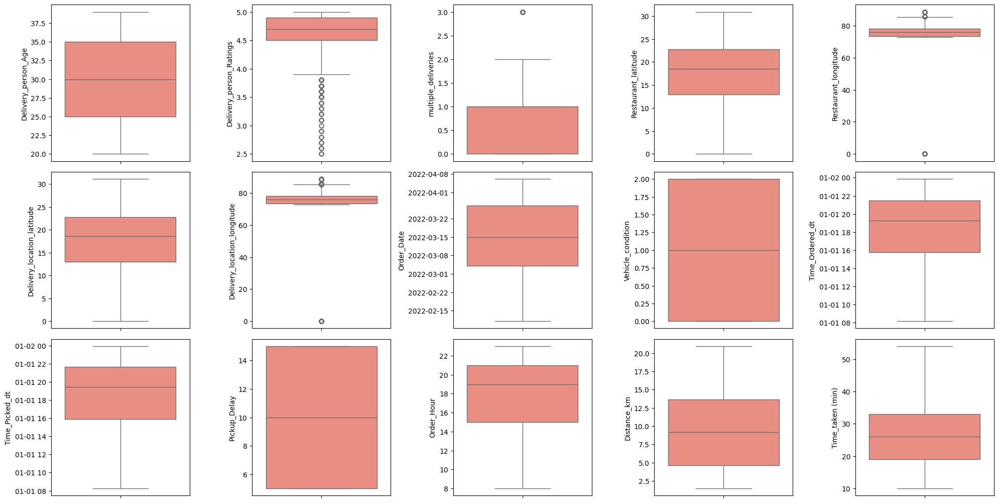

In [37]:
plt.figure(figsize=(20,50))

for i in range(0, len(num_features)):
    plt.subplot(len(num_features), 5, i+1)
    sns.boxplot(y=df_train[num_features[i]], color='salmon', orient='v')
    plt.tight_layout()

Walaupun terdeteksi ada outlier, tetapi nilai outlier tersebut wajar. Sehingga outlier akan dibiarkan the way it is.

### Univariate Analysis

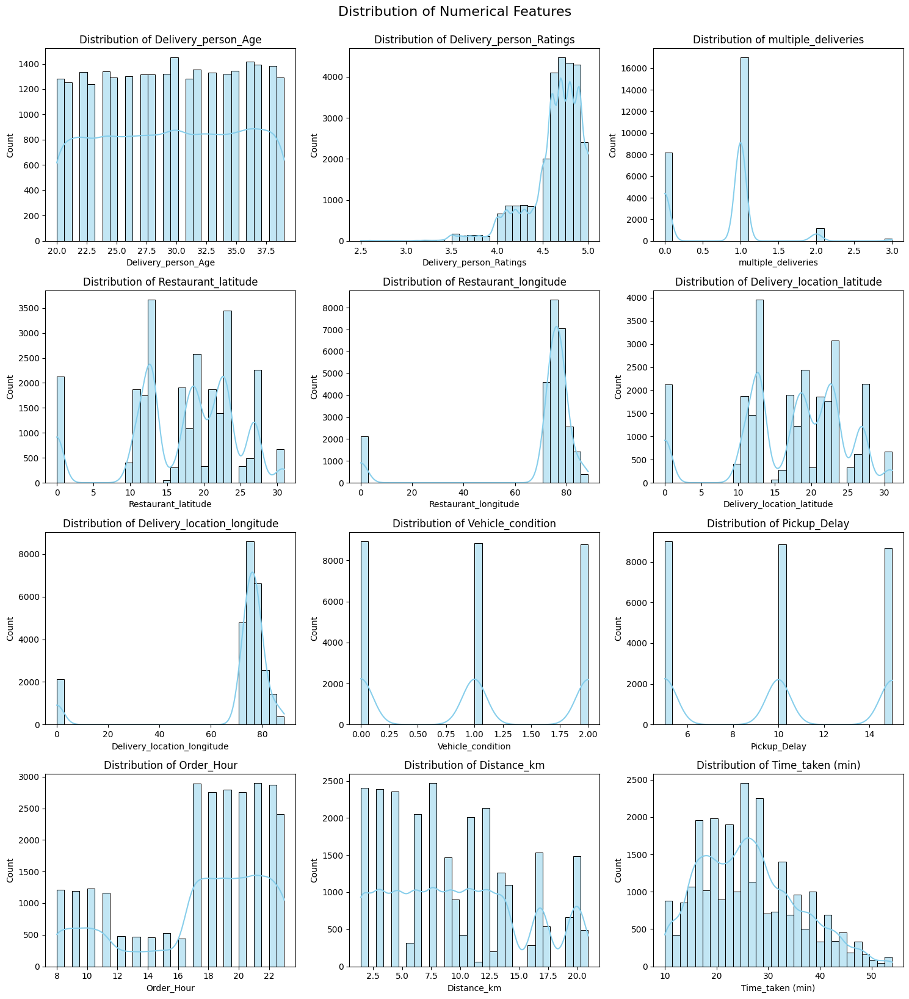

In [38]:
# List kolom yang ingin dikecualikan
exclude_cols = ['Order_Date', 'Time_Ordered_dt', 'Time_Picked_dt']

#  Mengambil kolom numerik
numerical_cols = [col for col in df_train.select_dtypes(include=np.number).columns if col not in exclude_cols]


# Membuat plot distribusi untuk kolom numerik
# Setup figure
n_cols = 3
n_rows = int(np.ceil(len(numerical_cols) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*5, n_rows*4))
axes = axes.flatten()

# Plot
for i, col in enumerate(numerical_cols):
    sns.histplot(df_train[col], kde=True, bins=30, color='skyblue', ax=axes[i])
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Count')

# Hapus subplot kosong (jika ada)
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle('Distribution of Numerical Features', fontsize=16, y=1.02)
plt.show()



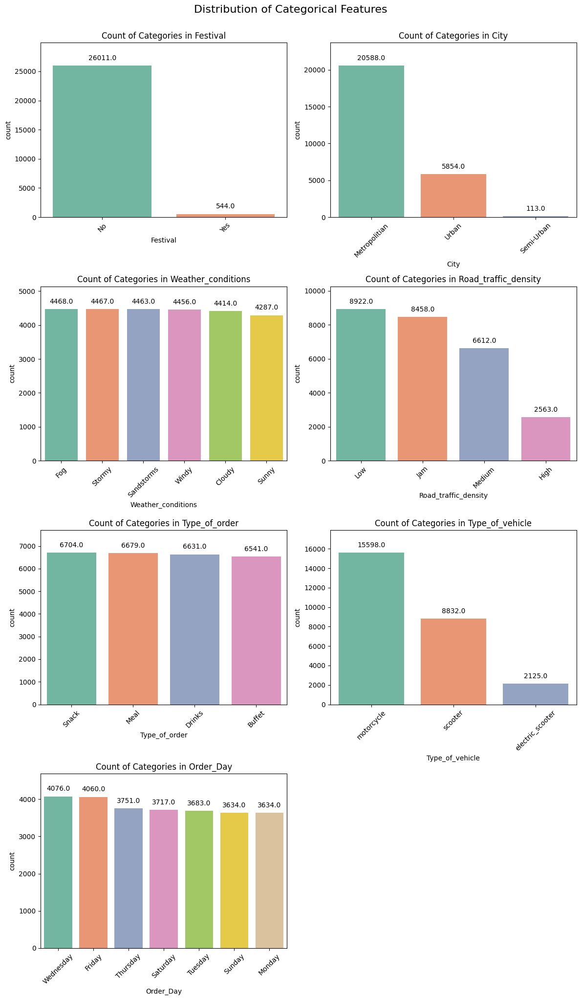

In [39]:
# List kolom yang ingin dikecualikan
exclude_cols_cat = ['ID', 'Delivery_person_ID', 'Time_Orderd', 'Time_Order_picked']

# Memilih kolom kategorikal
categorical_cols = [col for col in df_train.select_dtypes(include='object').columns if col not in exclude_cols_cat]

# Setup figure
n_cols = 2
n_rows = int(np.ceil(len(categorical_cols) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*6, n_rows*5))
axes = axes.flatten()

# Plot
for i, col in enumerate(categorical_cols):
    ax = axes[i]
    sns.countplot(data=df_train, x=col, ax=ax, palette='Set2', order=df_train[col].value_counts().index)
    ax.set_title(f'Count of Categories in {col}')
    ax.tick_params(axis='x', rotation=45)

    # Cari nilai tertinggi untuk set y-limit
    max_height = 0
    for p in ax.patches:
        height = p.get_height()
        max_height = max(max_height, height)
        ax.annotate(f'{height}',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom', fontsize=10, color='black',
                    xytext=(0, 6), textcoords='offset points')  # Jarak label ke bar

    ax.set_ylim(0, max_height * 1.15)  # Tambah ruang di atas bar

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle('Distribution of Categorical Features', fontsize=16, y=1.02)
plt.show()


### Multivariate

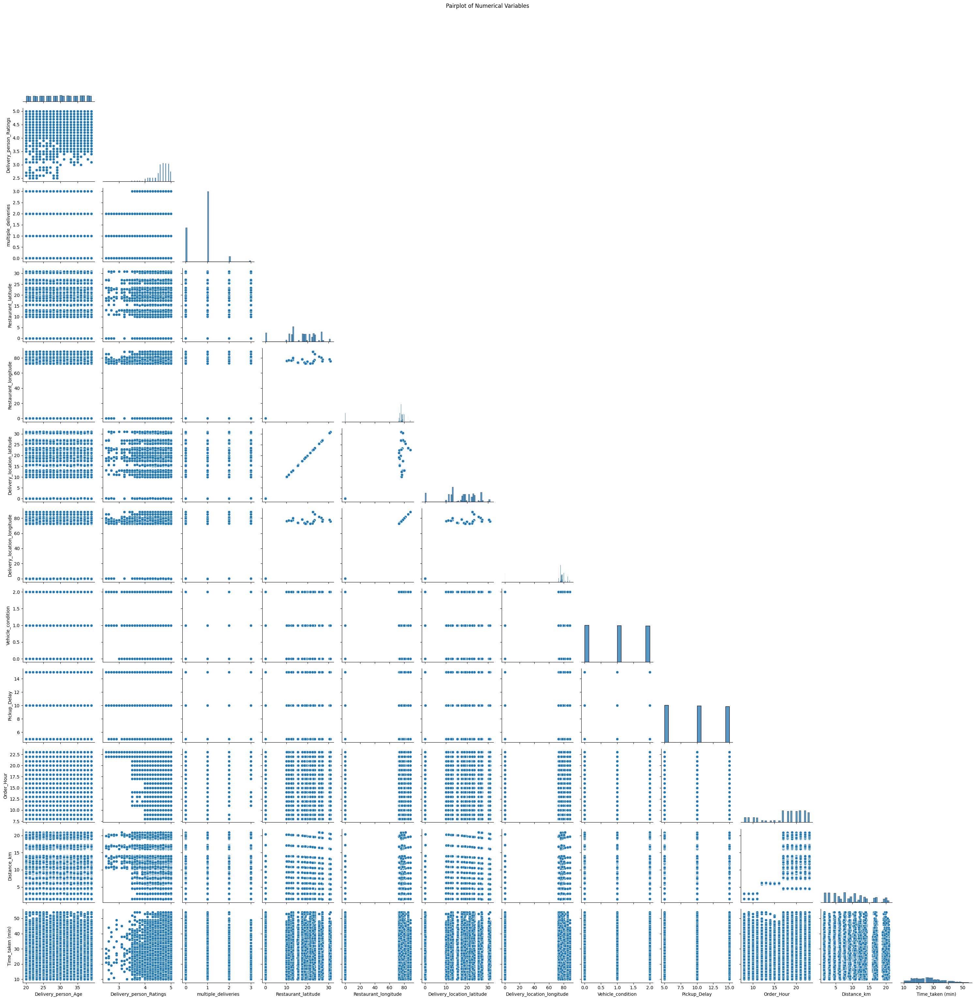

In [40]:
# Pairplot
sns.pairplot(df_train[numerical_cols], corner=True)
plt.tight_layout()
plt.suptitle("Pairplot of Numerical Variables", y=1.02)
plt.show()


### Deep Dive

In [41]:
# Korelasi Fitur Numerik terhadap Time_taken
numeric_df = df_train.select_dtypes(include=['int64', 'float64'])

correlation_table = numeric_df.corr()['Time_taken (min)'].sort_values(ascending=False).to_frame()
correlation_table.columns = ['Correlation with Time_taken']
correlation_table

,Correlation with Time_taken
Time_taken (min),1.000000
Delivery_person_Age,0.012662
Order_Hour,0.005914
Pickup_Delay,0.004585
Restaurant_longitude,-0.000192
Delivery_location_longitude,-0.000195
Distance_km,-0.001641
Vehicle_condition,-0.003818
multiple_deliveries,-0.007520
Delivery_person_Ratings,-0.010435


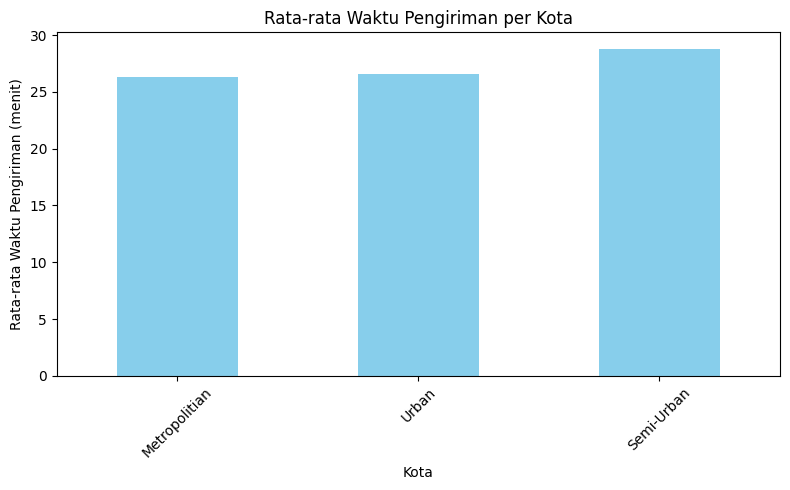

In [42]:
# Rata-Rata waktu pengiriman per kota
city_stats = df_train.groupby('City')['Time_taken (min)'].mean().sort_values()
plt.figure(figsize=(8, 5))
city_stats.plot(kind='bar', color='skyblue')
plt.title('Rata-rata Waktu Pengiriman per Kota')
plt.xlabel('Kota')
plt.ylabel('Rata-rata Waktu Pengiriman (menit)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

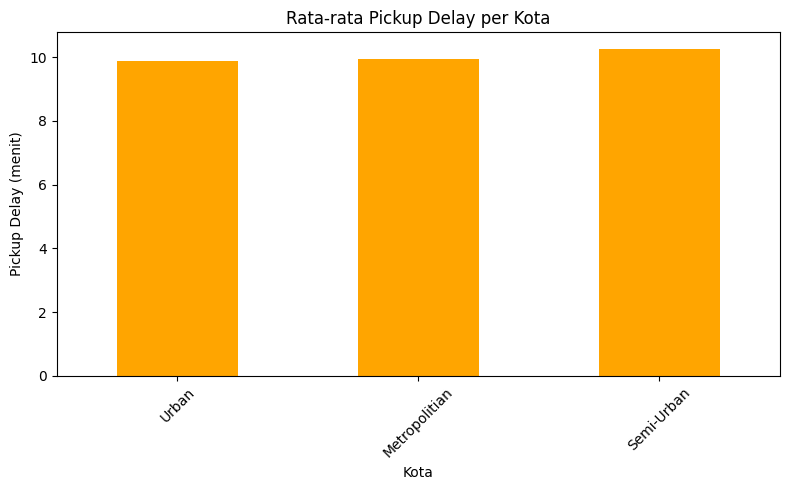

In [43]:
# Rata-rata Pickup Delay per kota
plt.figure(figsize=(8, 5))
df_train.groupby('City')['Pickup_Delay'].mean().sort_values().plot(kind='bar', color='orange')
plt.title('Rata-rata Pickup Delay per Kota')
plt.xlabel('Kota')
plt.ylabel('Pickup Delay (menit)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

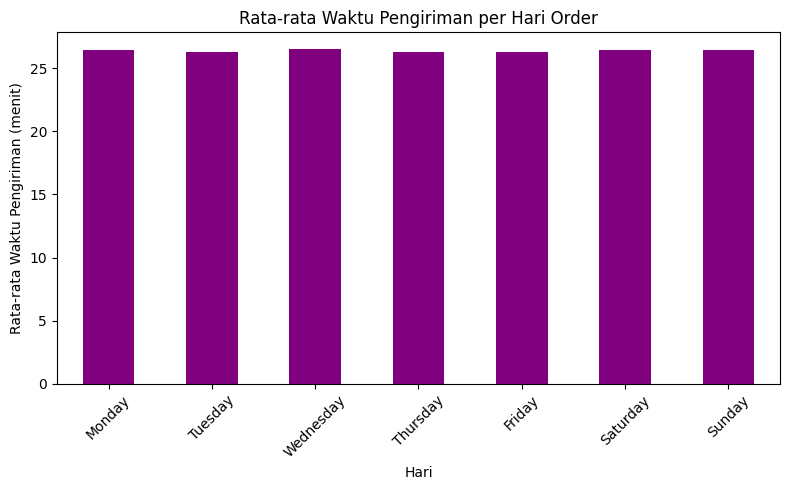

In [44]:
# Rata-rata waktu pengiriman per hari
plt.figure(figsize=(8, 5))
df_train.groupby('Order_Day')['Time_taken (min)'].mean().reindex([
    'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'
]).plot(kind='bar', color='purple')
plt.title('Rata-rata Waktu Pengiriman per Hari Order')
plt.xlabel('Hari')
plt.ylabel('Rata-rata Waktu Pengiriman (menit)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


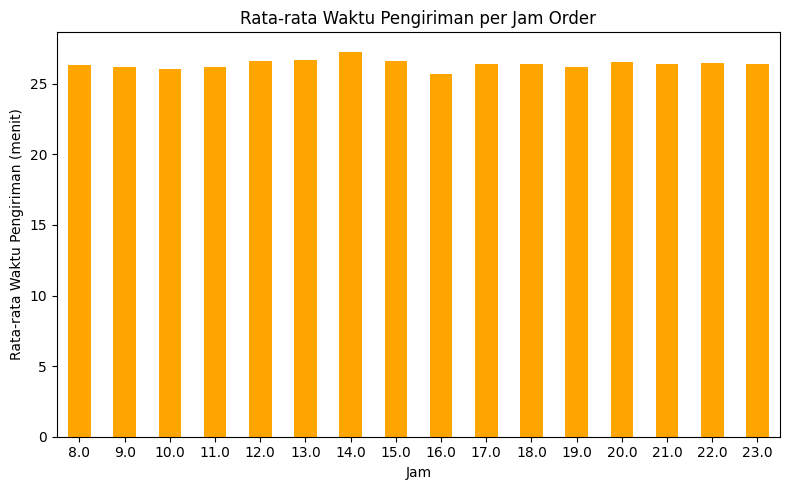

In [45]:
# Rata-rata waktu pengiriman per jam
plt.figure(figsize=(8, 5))
df_train.groupby('Order_Hour')['Time_taken (min)'].mean().plot(kind='bar', color='orange')
plt.title('Rata-rata Waktu Pengiriman per Jam Order')
plt.xlabel('Jam')
plt.ylabel('Rata-rata Waktu Pengiriman (menit)')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

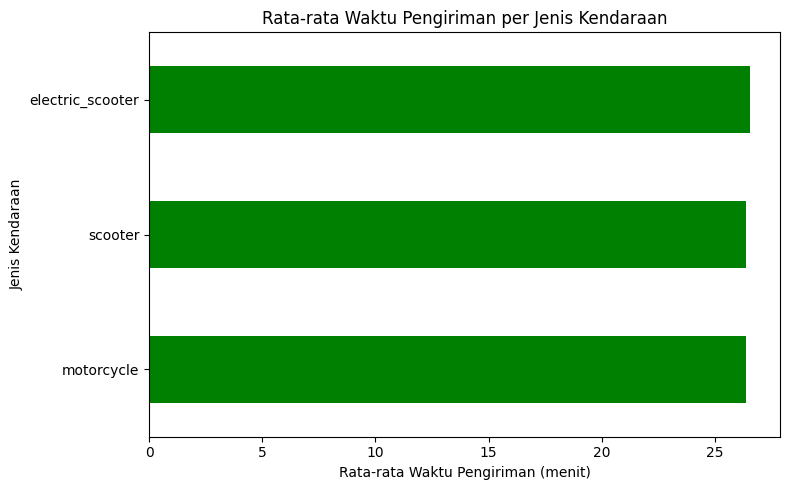

In [46]:
# Rata-rata waktu pengiriman per jenis kendaraan
vehicle_stats = df_train.groupby('Type_of_vehicle')['Time_taken (min)'].mean().sort_values()
plt.figure(figsize=(8, 5))
vehicle_stats.plot(kind='barh', color='green')
plt.title('Rata-rata Waktu Pengiriman per Jenis Kendaraan')
plt.xlabel('Rata-rata Waktu Pengiriman (menit)')
plt.ylabel('Jenis Kendaraan')
plt.tight_layout()
plt.show()


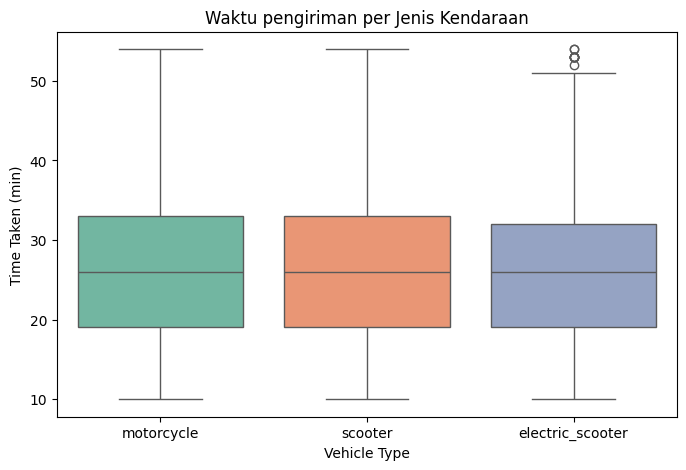

In [47]:
# Pengaruh jenis kendaraan
plt.figure(figsize=(8, 5))
sns.boxplot(data=df_train, x='Type_of_vehicle', y='Time_taken (min)', palette='Set2')
plt.title('Waktu pengiriman per Jenis Kendaraan')
plt.xlabel('Vehicle Type')
plt.ylabel('Time Taken (min)')
plt.show()

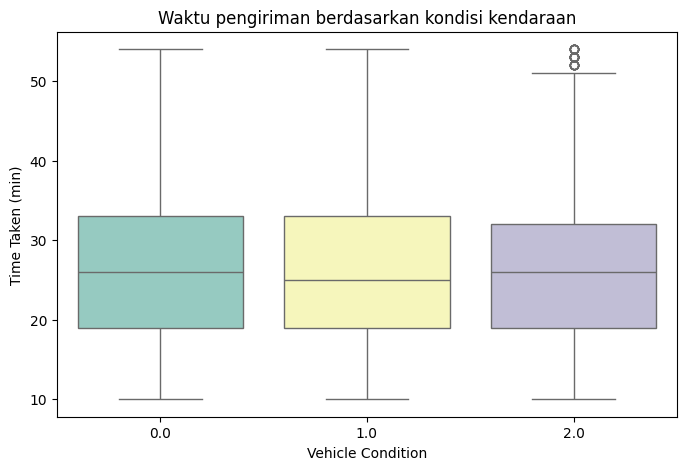

In [48]:
# Pengaruh kondisi kendaraan
plt.figure(figsize=(8, 5))
sns.boxplot(data=df_train, x='Vehicle_condition', y='Time_taken (min)', palette='Set3')
plt.title('Waktu pengiriman berdasarkan kondisi kendaraan')
plt.xlabel('Vehicle Condition')
plt.ylabel('Time Taken (min)')
plt.show()

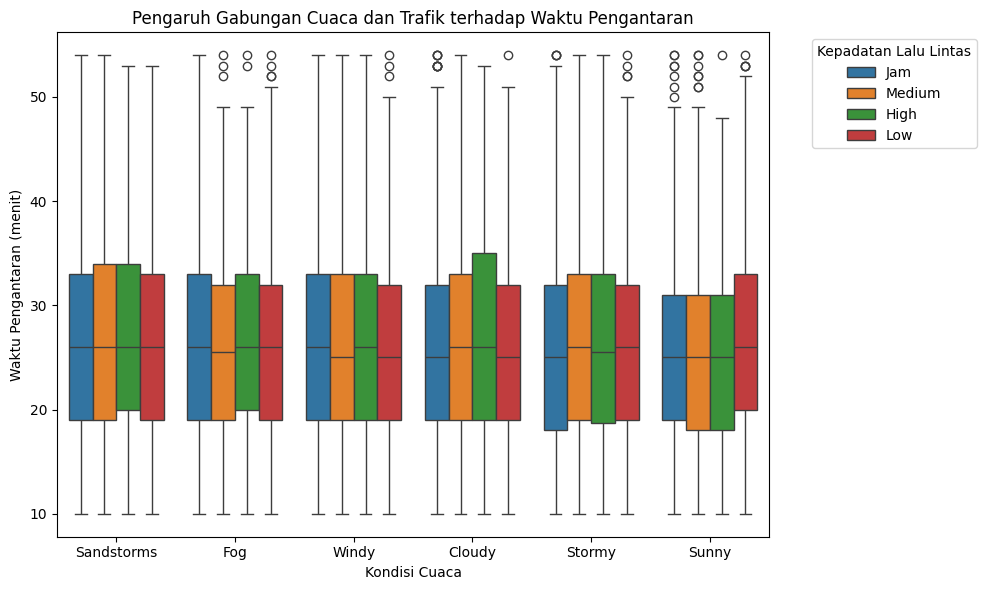

In [49]:
# Pengaruh cuaca dan kepadatan jalan
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_train, x='Weather_conditions', y='Time_taken (min)', hue='Road_traffic_density')
plt.title('Pengaruh Gabungan Cuaca dan Trafik terhadap Waktu Pengantaran')
plt.xlabel('Kondisi Cuaca')
plt.ylabel('Waktu Pengantaran (menit)')
plt.legend(title='Kepadatan Lalu Lintas', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

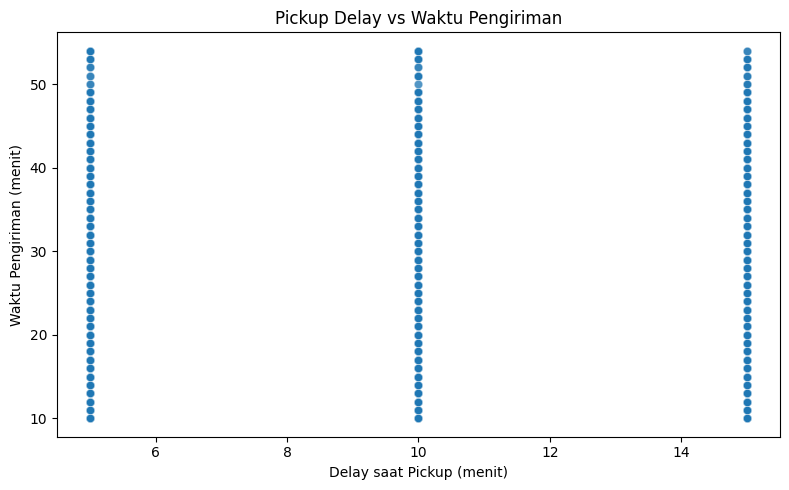

In [50]:
# Pickup Delay vs Time Taken
plt.figure(figsize=(8, 5))
sns.scatterplot(x='Pickup_Delay', y='Time_taken (min)', data=df_train, alpha=0.3)
plt.title('Pickup Delay vs Waktu Pengiriman')
plt.xlabel('Delay saat Pickup (menit)')
plt.ylabel('Waktu Pengiriman (menit)')
plt.tight_layout()
plt.show()

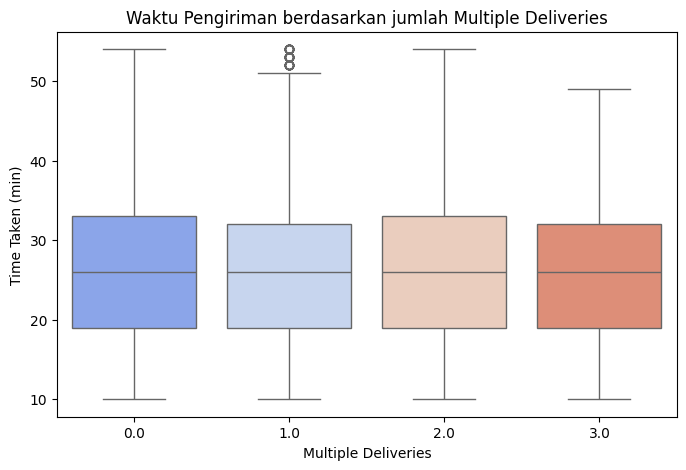

In [51]:
plt.figure(figsize=(8, 5))
sns.boxplot(data=df_train, x='multiple_deliveries', y='Time_taken (min)', palette='coolwarm')
plt.title('Waktu Pengiriman berdasarkan jumlah Multiple Deliveries')
plt.xlabel('Multiple Deliveries')
plt.ylabel('Time Taken (min)')
plt.show()


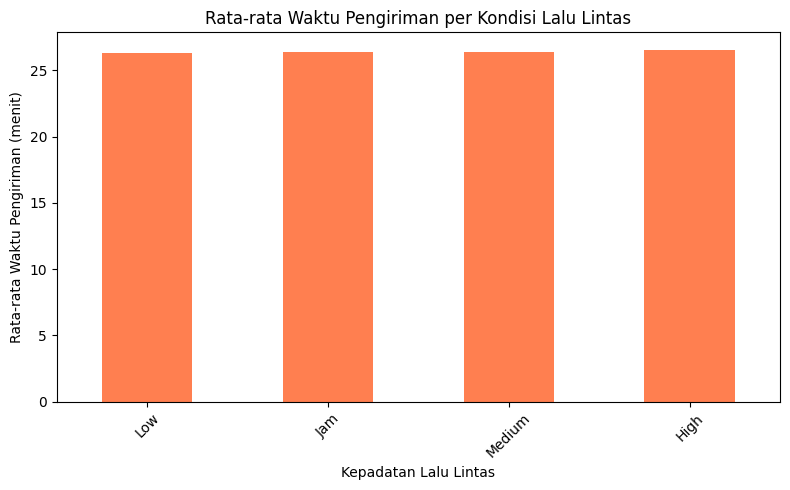

In [52]:
# Waktu Pengiriman Berdasarkan Kondisi Jalan
plt.figure(figsize=(8, 5))
df_train.groupby('Road_traffic_density')['Time_taken (min)'].mean().sort_values().plot(kind='bar', color='coral')
plt.title('Rata-rata Waktu Pengiriman per Kondisi Lalu Lintas')
plt.xlabel('Kepadatan Lalu Lintas')
plt.ylabel('Rata-rata Waktu Pengiriman (menit)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


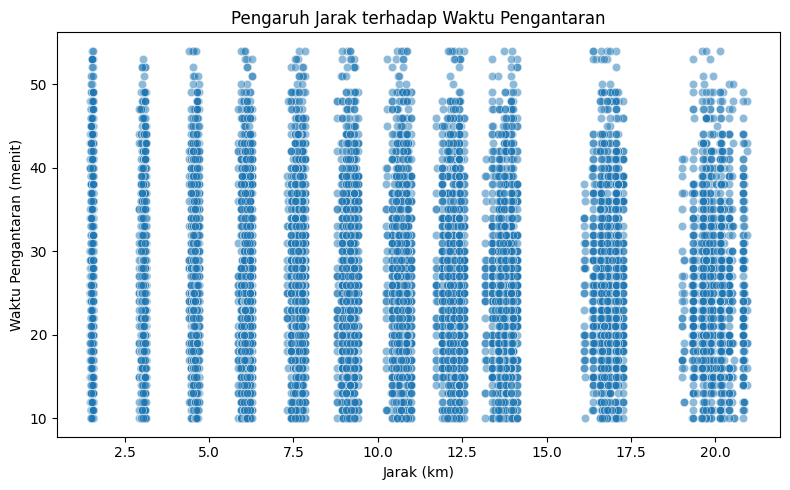

In [53]:
# Jarak dengan wakktu pengiriman
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df_train, x='Distance_km', y='Time_taken (min)', alpha=0.5)
plt.title('Pengaruh Jarak terhadap Waktu Pengantaran')
plt.xlabel('Jarak (km)')
plt.ylabel('Waktu Pengantaran (menit)')
plt.tight_layout()
plt.show()


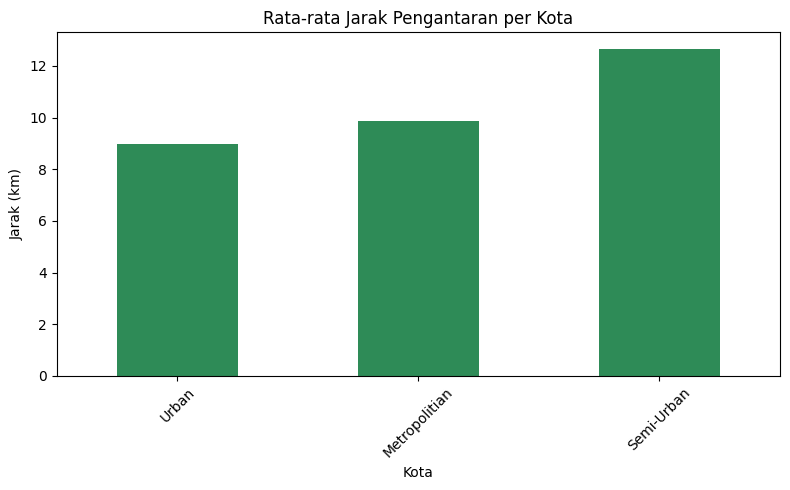

In [54]:
# Jarak pengantaran berdasarkan kota
plt.figure(figsize=(8, 5))
df_train.groupby('City')['Distance_km'].mean().sort_values().plot(kind='bar', color='seagreen')
plt.title('Rata-rata Jarak Pengantaran per Kota')
plt.xlabel('Kota')
plt.ylabel('Jarak (km)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


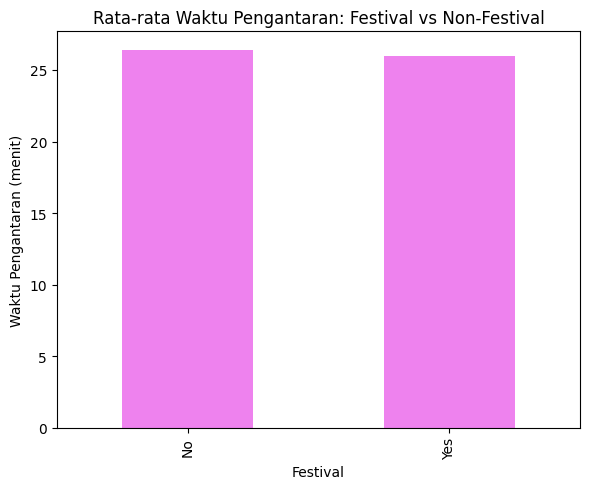

In [55]:
# Waktu pengantaran saat festival
plt.figure(figsize=(6, 5))
df_train.groupby('Festival')['Time_taken (min)'].mean().plot(kind='bar', color='violet')
plt.title('Rata-rata Waktu Pengantaran: Festival vs Non-Festival')
plt.xlabel('Festival')
plt.ylabel('Waktu Pengantaran (menit)')
plt.tight_layout()
plt.show()


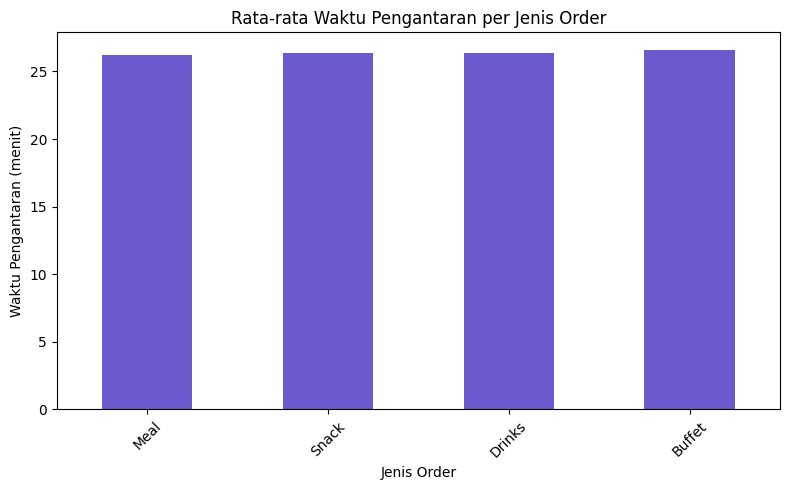

In [56]:
# Pengaruh jenis order
plt.figure(figsize=(8, 5))
df_train.groupby('Type_of_order')['Time_taken (min)'].mean().sort_values().plot(kind='bar', color='slateblue')
plt.title('Rata-rata Waktu Pengantaran per Jenis Order')
plt.xlabel('Jenis Order')
plt.ylabel('Waktu Pengantaran (menit)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


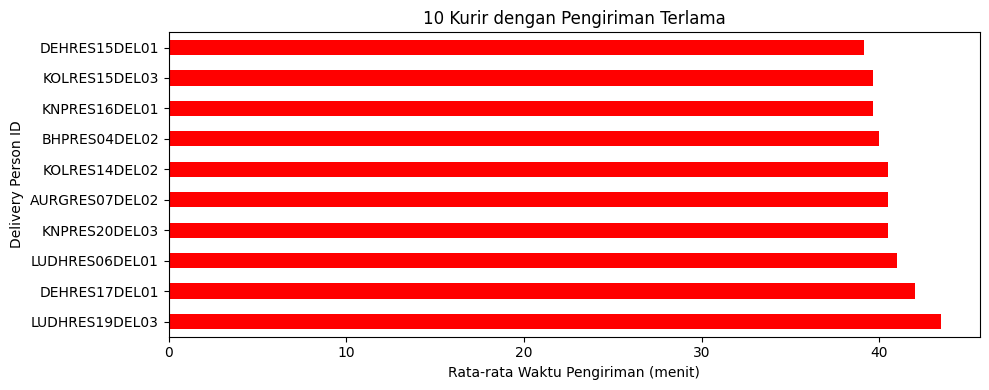

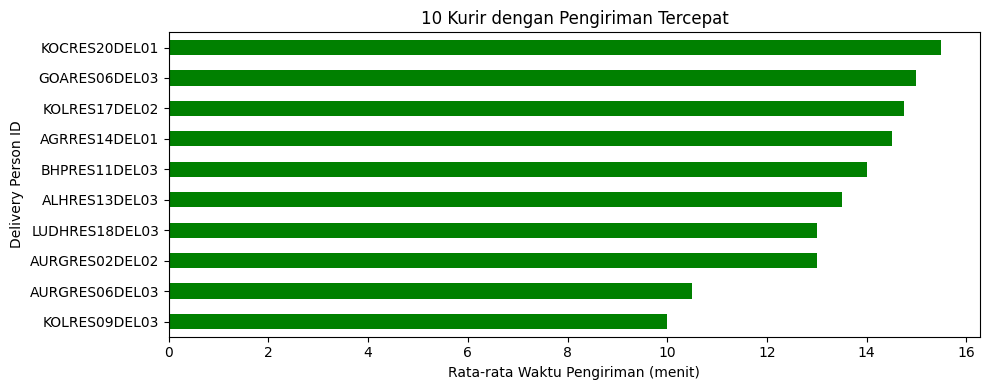

In [57]:
# Rata-rata Waktu Pengiriman per Delivery Person ID (Top/Bottom 10)

top10_slowest = df_train.groupby('Delivery_person_ID')['Time_taken (min)'].mean().sort_values(ascending=False).head(10)
top10_fastest = df_train.groupby('Delivery_person_ID')['Time_taken (min)'].mean().sort_values().head(10)

plt.figure(figsize=(10, 4))
top10_slowest.plot(kind='barh', color='red')
plt.title('10 Kurir dengan Pengiriman Terlama')
plt.xlabel('Rata-rata Waktu Pengiriman (menit)')
plt.ylabel('Delivery Person ID')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 4))
top10_fastest.plot(kind='barh', color='green')
plt.title('10 Kurir dengan Pengiriman Tercepat')
plt.xlabel('Rata-rata Waktu Pengiriman (menit)')
plt.ylabel('Delivery Person ID')
plt.tight_layout()
plt.show()

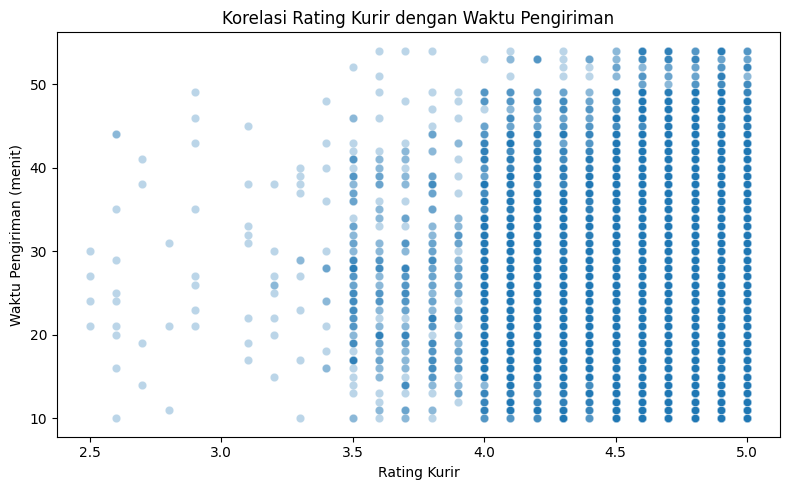

In [58]:
# Rating Kurir vs Waktu pengiriman
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df_train, x='Delivery_person_Ratings', y='Time_taken (min)', alpha=0.3)
plt.title('Korelasi Rating Kurir dengan Waktu Pengiriman')
plt.xlabel('Rating Kurir')
plt.ylabel('Waktu Pengiriman (menit)')
plt.tight_layout()
plt.show()


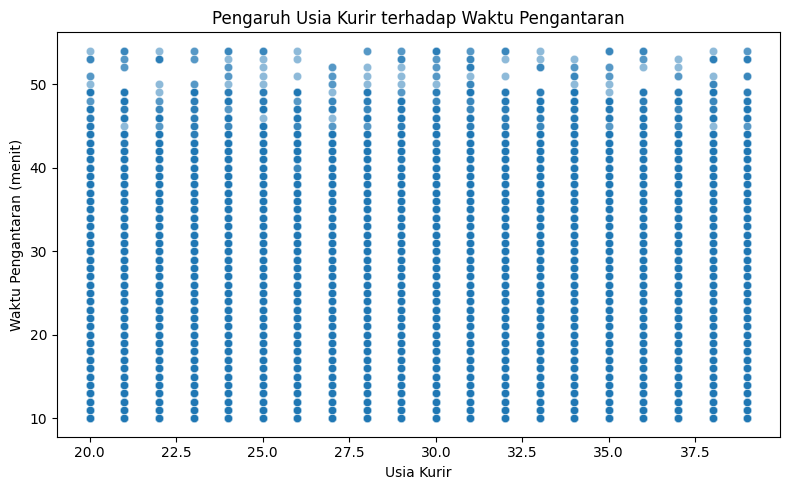

In [59]:
# Usia Kurir vs Waktu Pengiriman
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df_train, x='Delivery_person_Age', y='Time_taken (min)', alpha=0.5)
plt.title('Pengaruh Usia Kurir terhadap Waktu Pengantaran')
plt.xlabel('Usia Kurir')
plt.ylabel('Waktu Pengantaran (menit)')
plt.tight_layout()
plt.show()


### **Multicolinearity**

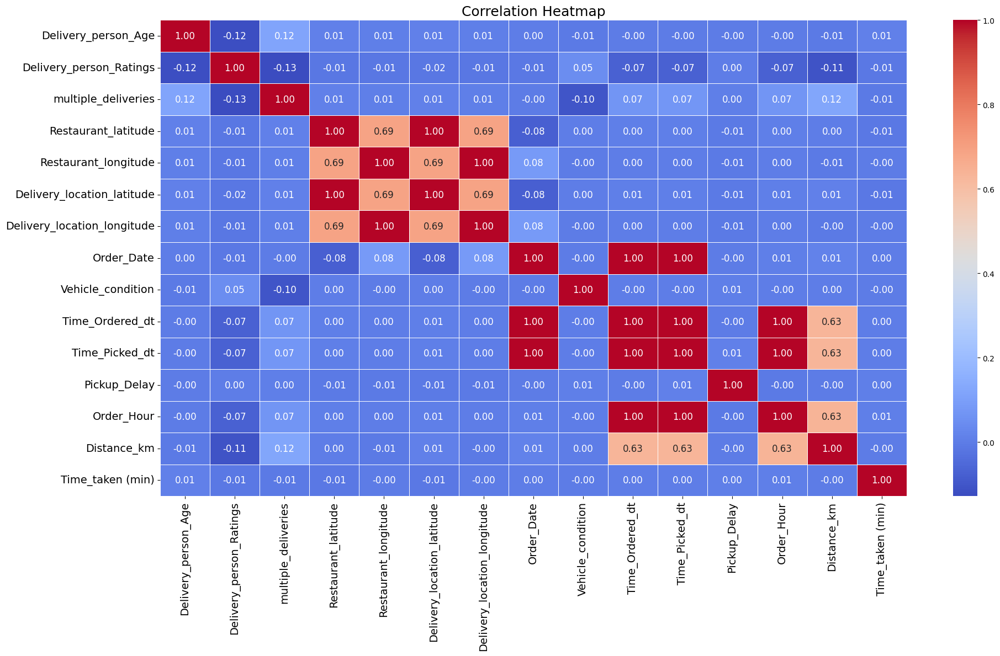

In [60]:
# Mengambil subset data yang hanya berisi fitur numerik dari fitur (X_train)
df_train_num = df_train.select_dtypes(exclude=['object'])

# Menghitung korelasi
corr_matrix = df_train_num.corr()

# Visualisasi heatmap
plt.figure(figsize=(20, 12))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    linewidths=0.5,
    annot_kws={"size": 12}  # ukuran font angka korelasi
)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14, rotation=360)
plt.title("Correlation Heatmap", fontsize=18)
plt.tight_layout()
plt.show()

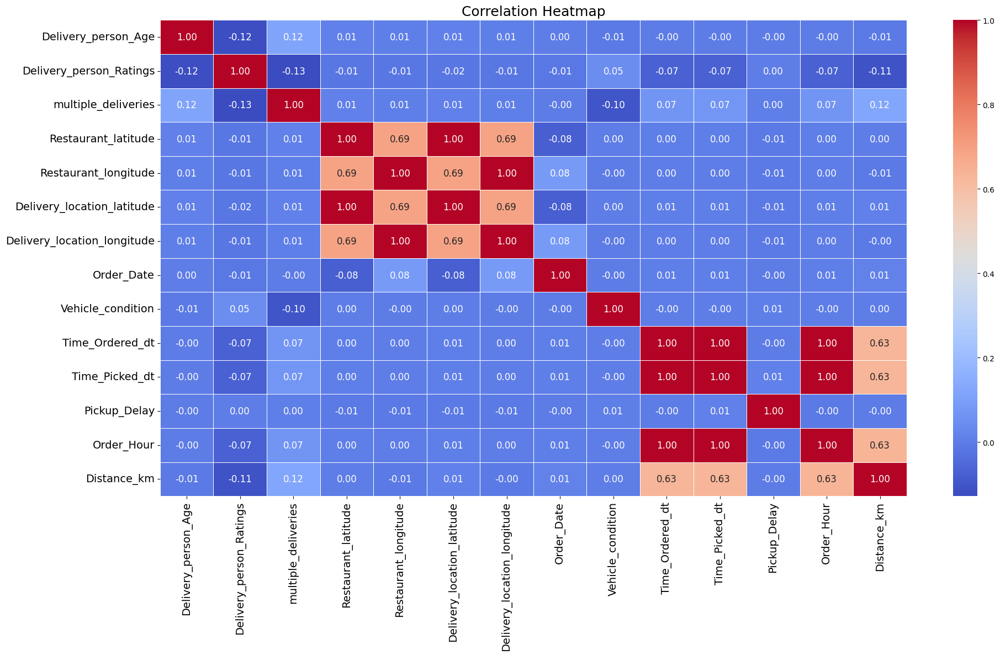

In [61]:
# Mengambil subset data yang hanya berisi fitur numerik dari fitur (X_train)
X_train_num = X_train.select_dtypes(exclude=['object'])

# Menghitung korelasi
corr_matrix = X_train_num.corr()

# Visualisasi heatmap
plt.figure(figsize=(20, 12))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    linewidths=0.5,
    annot_kws={"size": 12}  # ukuran font angka korelasi
)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14, rotation=360)
plt.title("Correlation Heatmap", fontsize=18)
plt.tight_layout()
plt.show()

Dari heatmap tersebut, dapat diketahui fitur yang memiliki korelasi tinggi (> 0.8) dengan fitur lainnya, yakni:
- Restaurant_latitude -- Delivery_location_latitude
- Restaurant_longitude -- Delivery_location_longitude
- Time_Ordered_dt -- Order_Date
- Time_Picked_dt -- Order_Date


## **Drop Columns**

Berikut list fitur-fitur yang akan di-drop karena tidak dibutuhkan untuk modeling atau memiliki colinearity yang tinggi
- ID
- Delivery_person_ID
- Order_Date
- Time_Orderd
- Time_Order_picked
- Time_Ordered_dt
- Time_Picked_dt
- Restaurant_latitude
- Restaurant_longitude



In [62]:
X_train_copy = X_train.copy()
X_test_copy = X_test.copy()

In [63]:
# List kolom yang akan di-drop
cols_to_drop = [
    'ID', 'Delivery_person_ID', 'Order_Date', 'Time_Orderd', 'Time_Order_picked', 'Time_Ordered_dt', 'Time_Picked_dt',
    'Restaurant_latitude', 'Restaurant_longitude'
]

# Drop kolom-kolom tersebut dari X_train dan X_test
X_train = X_train.drop(columns=cols_to_drop, errors='ignore')
X_test = X_test.drop(columns=cols_to_drop, errors='ignore')

In [64]:
X_train.head()

,Delivery_person_Age,Delivery_person_Ratings,multiple_deliveries,Festival,City,Delivery_location_latitude,Delivery_location_longitude,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,Pickup_Delay,Order_Hour,Order_Day,Distance_km
0,32.0,4.9,1.0,No,Metropolitian,30.962872,75.886808,Sandstorms,Jam,1,Meal,motorcycle,5.0,19,Thursday,8.782495
1,27.0,4.9,0.0,Yes,Urban,13.036229,77.726791,Fog,Jam,1,Meal,scooter,15.0,20,Wednesday,20.144000
2,20.0,4.8,1.0,No,Metropolitian,31.044057,75.969820,Windy,Jam,1,Meal,scooter,5.0,20,Friday,19.024912
3,28.0,4.7,0.0,No,Metropolitian,22.862225,76.004765,Windy,Medium,0,Buffet,motorcycle,15.0,18,Friday,19.632051
4,20.0,4.6,0.0,No,Urban,10.029778,76.366106,Sandstorms,Jam,1,Meal,scooter,10.0,21,Monday,10.901866


In [65]:
X_test.head()

,Delivery_person_Age,Delivery_person_Ratings,multiple_deliveries,Festival,City,Delivery_location_latitude,Delivery_location_longitude,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,Pickup_Delay,Order_Hour,Order_Day,Distance_km
0,24.0,4.7,1.0,No,Urban,0.040000,0.040000,Fog,High,1,Buffet,motorcycle,5.0,12,Tuesday,6.276139
1,21.0,4.7,0.0,No,Metropolitian,11.033681,77.005525,Windy,Medium,1,Buffet,scooter,15.0,17,Thursday,4.664774
2,32.0,3.9,2.0,No,Urban,26.981378,75.859034,Sandstorms,Medium,2,Drinks,electric_scooter,5.0,17,Thursday,10.415215
3,24.0,4.1,1.0,No,Metropolitian,18.947584,72.852585,Stormy,Low,0,Snack,motorcycle,10.0,8,Sunday,3.055960
4,23.0,4.9,1.0,No,Metropolitian,17.501028,78.419645,Fog,Low,1,Drinks,motorcycle,15.0,23,Tuesday,13.806284


## **Encoding**

In [66]:
# Kolom yang akan di-encode menggunakan OneHotEncoder
cat_columns_ohe = ['Weather_conditions', 'Road_traffic_density', 'Type_of_order', 'Type_of_vehicle', 'Festival', 'City', 'Order_Day']

# Menginisiasi OneHotEncoder
ohe_encoder = OneHotEncoder(sparse_output=False, drop='first')

# Fit dan transform pada data train
X_train_encoded_ohe = ohe_encoder.fit_transform(X_train[cat_columns_ohe])

# Transform pada data test
X_test_encoded_ohe = ohe_encoder.transform(X_test[cat_columns_ohe])

# Mengubah hasil encoding menjadi DataFrame
X_train_encoded_ohe_df = pd.DataFrame(X_train_encoded_ohe, columns=ohe_encoder.get_feature_names_out())
X_test_encoded_ohe_df = pd.DataFrame(X_test_encoded_ohe, columns=ohe_encoder.get_feature_names_out())

# Mengabungkan hasil encoding dengan data train dan test
X_train = pd.concat([X_train.drop(columns=cat_columns_ohe), X_train_encoded_ohe_df], axis=1)
X_test = pd.concat([X_test.drop(columns=cat_columns_ohe), X_test_encoded_ohe_df], axis=1)

In [67]:
# Menyimpan encoder untuk digunakan di deployment
#joblib.dump(ohe_encoder, 'ohe_encoder.pkl')

In [68]:
X_train.head()

,Delivery_person_Age,Delivery_person_Ratings,multiple_deliveries,Delivery_location_latitude,Delivery_location_longitude,Vehicle_condition,Pickup_Delay,Order_Hour,Distance_km,Weather_conditions_Fog,Weather_conditions_Sandstorms,Weather_conditions_Stormy,Weather_conditions_Sunny,Weather_conditions_Windy,Road_traffic_density_Jam,Road_traffic_density_Low,Road_traffic_density_Medium,Type_of_order_Drinks,Type_of_order_Meal,Type_of_order_Snack,Type_of_vehicle_motorcycle,Type_of_vehicle_scooter,Festival_Yes,City_Semi-Urban,City_Urban,Order_Day_Monday,Order_Day_Saturday,Order_Day_Sunday,Order_Day_Thursday,Order_Day_Tuesday,Order_Day_Wednesday
0,32.0,4.9,1.0,30.962872,75.886808,1,5.0,19,8.782495,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,27.0,4.9,0.0,13.036229,77.726791,1,15.0,20,20.144000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
2,20.0,4.8,1.0,31.044057,75.969820,1,5.0,20,19.024912,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,28.0,4.7,0.0,22.862225,76.004765,0,15.0,18,19.632051,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,20.0,4.6,0.0,10.029778,76.366106,1,10.0,21,10.901866,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0


## **Scaling**

In [69]:
# Mengambil kolom numerik dari data train
numeric_cols = X_train.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Mengecualikan kolom hasil OHE (berisi 1/0)
exclude_prefix = ['Weather_conditions_', 'Road_traffic_', 'Type_of_order_', 'Type_of_vehicle', 'Festival_', 'City_', 'Order_Day_']

numeric_cols = [col for col in X_train.select_dtypes(include=['int64', 'float64']).columns
                if not any(col.startswith(prefix) for prefix in exclude_prefix)]

In [70]:
# Menginisialisasi StandardScaler
scaler = StandardScaler()

# Melakukan transformasi (scaling) hanya pada kolom numerik
X_train[numeric_cols] = scaler.fit_transform(X_train[numeric_cols])

# Melakukan scaling based on data train
X_test[numeric_cols] = scaler.transform(X_test[numeric_cols])

In [71]:
# Menyimpan scaler ke file .pkl
#joblib.dump(scaler, 'scaler.pkl')

In [72]:
X_train.head()

,Delivery_person_Age,Delivery_person_Ratings,multiple_deliveries,Delivery_location_latitude,Delivery_location_longitude,Vehicle_condition,Pickup_Delay,Order_Hour,Distance_km,Weather_conditions_Fog,Weather_conditions_Sandstorms,Weather_conditions_Stormy,Weather_conditions_Sunny,Weather_conditions_Windy,Road_traffic_density_Jam,Road_traffic_density_Low,Road_traffic_density_Medium,Type_of_order_Drinks,Type_of_order_Meal,Type_of_order_Snack,Type_of_vehicle_motorcycle,Type_of_vehicle_scooter,Festival_Yes,City_Semi-Urban,City_Urban,Order_Day_Monday,Order_Day_Saturday,Order_Day_Sunday,Order_Day_Thursday,Order_Day_Tuesday,Order_Day_Wednesday
0,0.414102,0.845756,0.432010,1.842009,0.240426,0.007425,-1.210095,19,-0.162203,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.455804,0.845756,-1.324001,-0.600894,0.327472,0.007425,1.239615,20,1.876115,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
2,-1.673672,0.527693,0.432010,1.853072,0.244353,0.007425,-1.210095,20,1.675344,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.281823,0.209630,-1.324001,0.738116,0.246006,-1.217296,1.239615,18,1.784268,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-1.673672,-0.108432,-1.324001,-1.010590,0.263101,0.007425,0.014760,21,0.218024,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0


In [73]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26555 entries, 0 to 26554
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Delivery_person_Age            26555 non-null  float64
 1   Delivery_person_Ratings        26555 non-null  float64
 2   multiple_deliveries            26555 non-null  float64
 3   Delivery_location_latitude     26555 non-null  float64
 4   Delivery_location_longitude    26555 non-null  float64
 5   Vehicle_condition              26555 non-null  float64
 6   Pickup_Delay                   26555 non-null  float64
 7   Order_Hour                     26555 non-null  int32  
 8   Distance_km                    26555 non-null  float64
 9   Weather_conditions_Fog         26555 non-null  float64
 10  Weather_conditions_Sandstorms  26555 non-null  float64
 11  Weather_conditions_Stormy      26555 non-null  float64
 12  Weather_conditions_Sunny       26555 non-null 

## **Model and Evaluation**

### Test

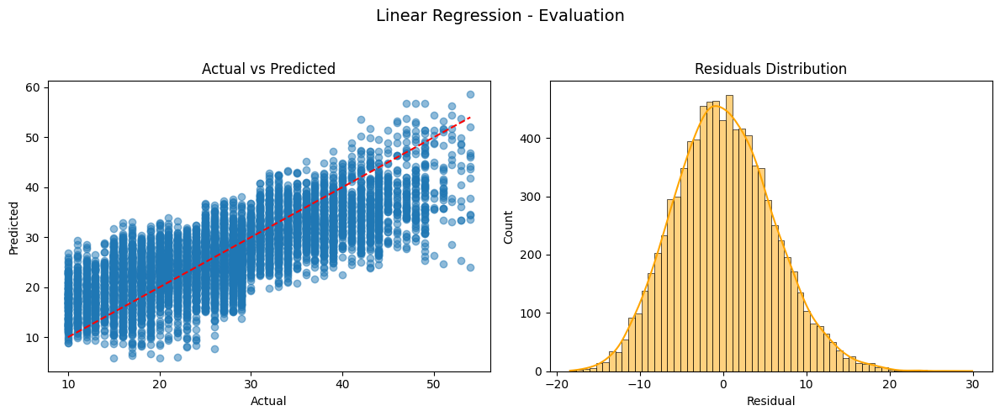

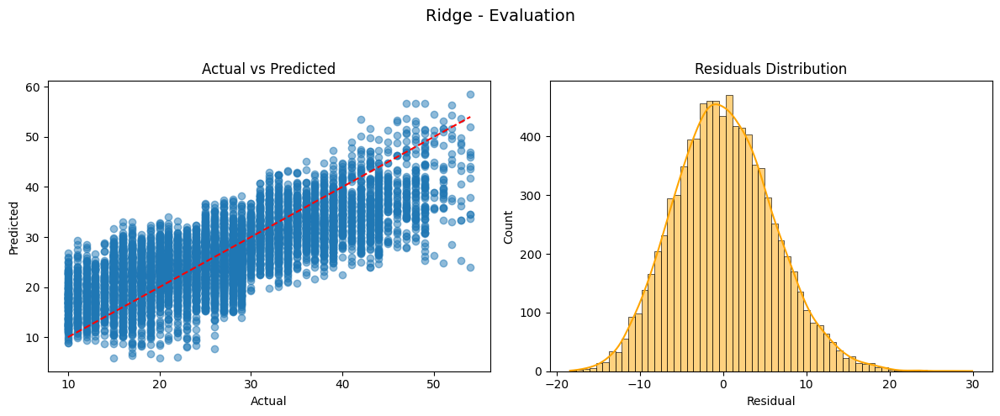

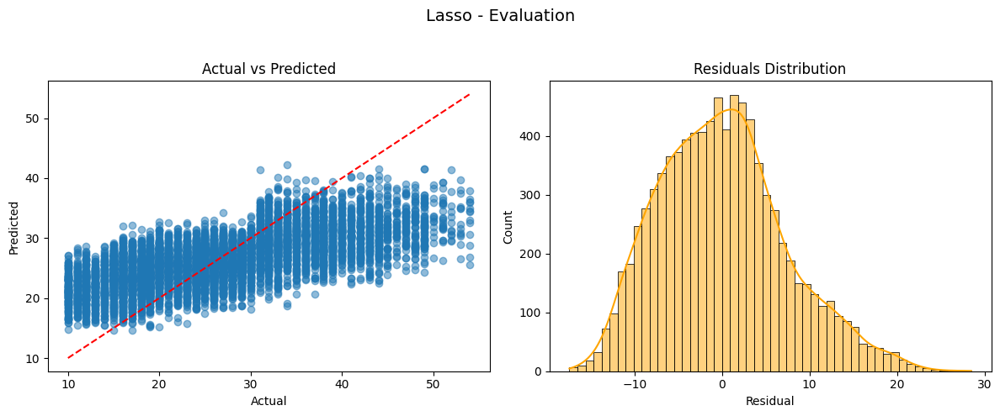

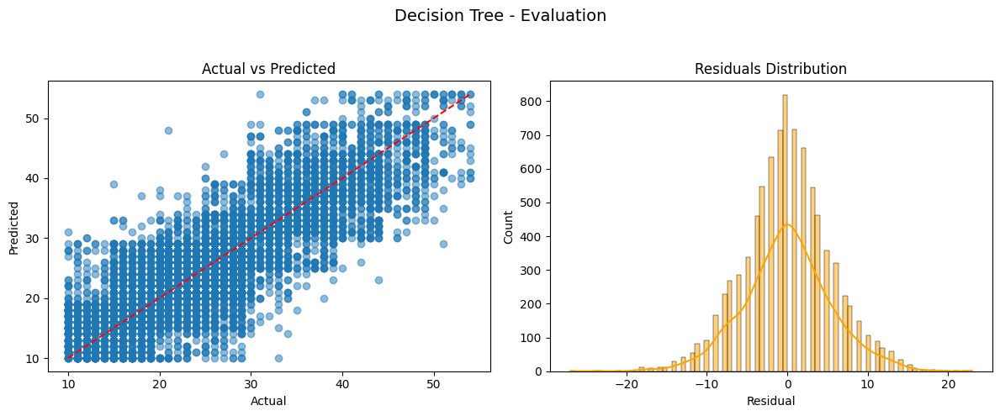

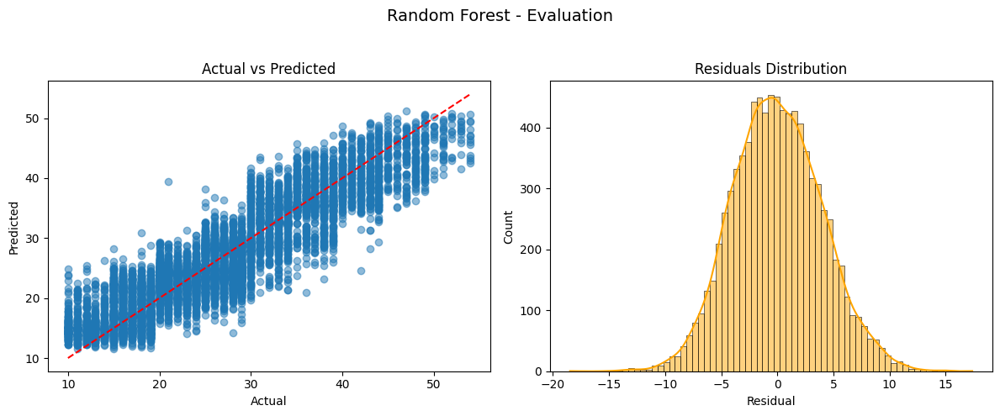

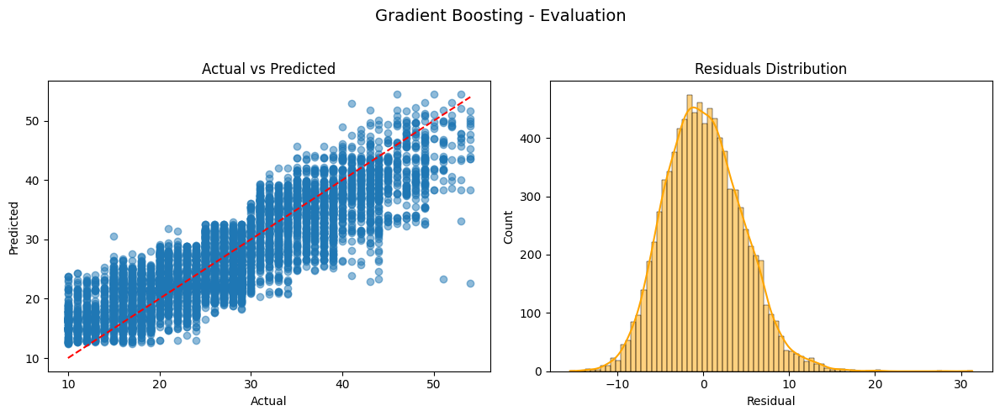

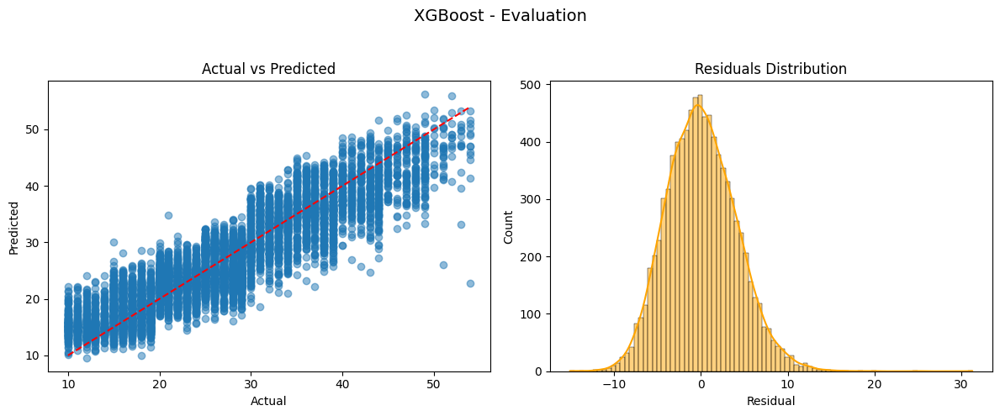

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003524 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 887
[LightGBM] [Info] Number of data points in the train set: 26555, number of used features: 31
[LightGBM] [Info] Start training from score 26.361137


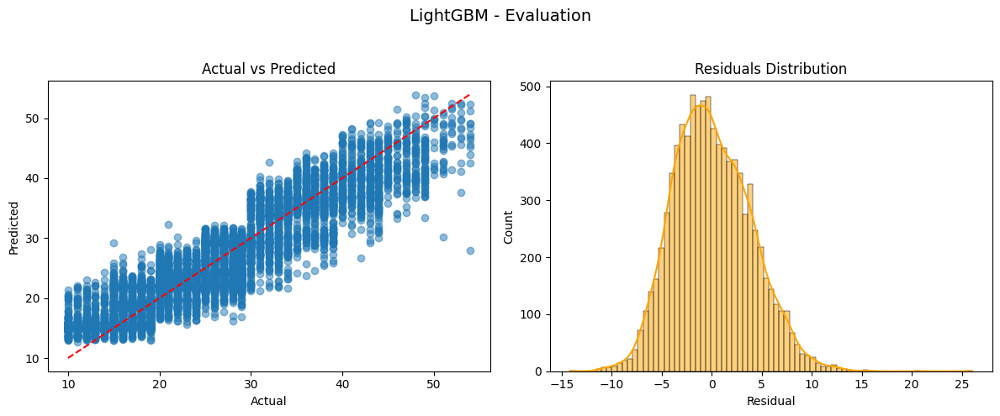

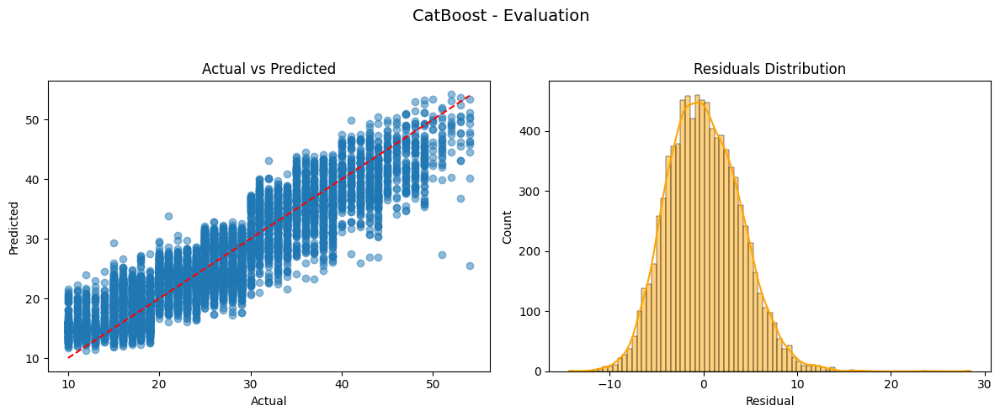

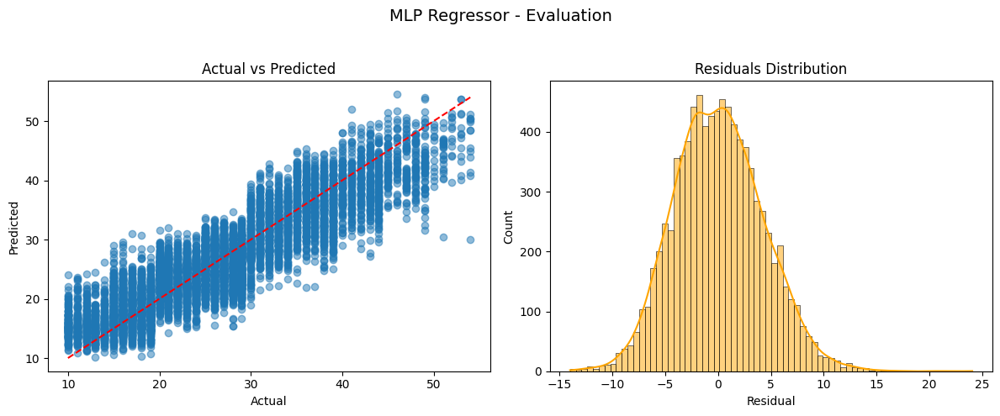

In [74]:
# Mendefinisikan model yang digunakan
models = {
    "Linear Regression": LinearRegression(),
    "Ridge": Ridge(),
    "Lasso": Lasso(),
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest": RandomForestRegressor(),
    "Gradient Boosting": GradientBoostingRegressor(),
    "XGBoost": xgb.XGBRegressor(),
    "LightGBM": lgb.LGBMRegressor(),
    "CatBoost": CatBoostRegressor(verbose=0),
    "MLP Regressor": MLPRegressor(max_iter=500)
}

# Menginisialisasi untuk menyimpan hasil
results = []

# Loop modeling + evaluation
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

    results.append({
        "Model": name,
        "RMSE": rmse,
        "MAE": mae,
        "MAPE (%)": mape,
        "R² Score": r2
    })

    # --- Visualization ---
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(f"{name} - Evaluation", fontsize=14)

    # 1. Actual vs Predicted
    axs[0].scatter(y_test, y_pred, alpha=0.5)
    axs[0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
    axs[0].set_xlabel("Actual")
    axs[0].set_ylabel("Predicted")
    axs[0].set_title("Actual vs Predicted")

    # 2. Residual Plot
    residuals = y_test - y_pred
    sns.histplot(residuals, kde=True, ax=axs[1], color='orange')
    axs[1].set_title("Residuals Distribution")
    axs[1].set_xlabel("Residual")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

In [75]:
# Hasil evaluasi
results_df = pd.DataFrame(results).sort_values("MAPE (%)")
results_df = results_df.round(2)
results_df

,Model,RMSE,MAE,MAPE (%),R² Score
8,CatBoost,3.90,3.12,13.51,0.83
7,LightGBM,3.88,3.12,13.52,0.83
6,XGBoost,4.02,3.19,13.75,0.82
4,Random Forest,3.96,3.17,13.76,0.82
9,MLP Regressor,4.18,3.34,14.48,0.80
5,Gradient Boosting,4.53,3.61,15.84,0.77
3,Decision Tree,5.46,4.18,17.98,0.66
0,Linear Regression,5.98,4.77,21.04,0.59
1,Ridge,5.98,4.77,21.04,0.59
2,Lasso,7.23,5.77,25.92,0.40


### Train vs Test Evaluation

In [76]:
# Mendefinisikan model yang digunakan
models = {
    "Linear Regression": LinearRegression(),
    "Ridge": Ridge(),
    "Lasso": Lasso(),
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest": RandomForestRegressor(),
    "Gradient Boosting": GradientBoostingRegressor(),
    "XGBoost": xgb.XGBRegressor(),
    "LightGBM": lgb.LGBMRegressor(),
    "CatBoost": CatBoostRegressor(verbose=0),
    "MLP Regressor": MLPRegressor(max_iter=500)
    }

results_train_test = []

for name, model in models.items():
    model.fit(X_train, y_train)

    # Predict
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    # Train metrics
    train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
    train_mae = mean_absolute_error(y_train, y_pred_train)
    train_r2 = r2_score(y_train, y_pred_train)
    train_mape = np.mean(np.abs((y_train - y_pred_train) / y_train)) * 100

    # Test metrics
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
    test_mae = mean_absolute_error(y_test, y_pred_test)
    test_r2 = r2_score(y_test, y_pred_test)
    test_mape = np.mean(np.abs((y_test - y_pred_test) / y_test)) * 100

    results_train_test.append({
          "Model": name,
          "Train RMSE": train_rmse,
          "Test RMSE": test_rmse,
          "Train MAE": train_mae,
          "Test MAE": test_mae,
          "Train MAPE (%)": train_mape,
          "Test MAPE (%)": test_mape,
          "Train R²": train_r2,
          "Train R²": train_r2,
          "Test R²": test_r2
        })

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 887
[LightGBM] [Info] Number of data points in the train set: 26555, number of used features: 31
[LightGBM] [Info] Start training from score 26.361137


In [77]:
# Hasil evaluasi
results_train_test_df = pd.DataFrame(results_train_test).sort_values("Test MAPE (%)")
results_train_test_df = results_train_test_df.round(2)
results_train_test_df

,Model,Train RMSE,Test RMSE,Train MAE,Test MAE,Train MAPE (%),Test MAPE (%),Train R²,Test R²
8,CatBoost,3.43,3.90,2.76,3.12,12.06,13.51,0.87,0.83
7,LightGBM,3.65,3.88,2.96,3.12,12.92,13.52,0.85,0.83
6,XGBoost,3.23,4.02,2.57,3.19,11.26,13.75,0.88,0.82
4,Random Forest,1.47,3.97,1.17,3.18,5.07,13.78,0.98,0.82
9,MLP Regressor,3.84,4.18,3.07,3.34,13.20,14.28,0.83,0.80
5,Gradient Boosting,4.46,4.53,3.57,3.61,15.81,15.84,0.78,0.77
3,Decision Tree,0.00,5.47,0.00,4.17,0.00,17.94,1.00,0.66
0,Linear Regression,5.94,5.98,4.73,4.77,20.98,21.04,0.60,0.59
1,Ridge,5.94,5.98,4.73,4.77,20.98,21.04,0.60,0.59
2,Lasso,7.24,7.23,5.76,5.77,25.88,25.92,0.41,0.40


In [78]:
results_df = pd.DataFrame(results)

# Model dengan MAPE terkecil dijadikan model terbaik
best_model_name = results_df.sort_values("MAPE (%)").iloc[0]["Model"]
best_model = models[best_model_name]

print(f"Model terbaik berdasarkan MAPE: {best_model_name}")

Model terbaik berdasarkan MAPE: CatBoost


In [79]:
#joblib.dump(best_model, f"{best_model_name}_model.pkl")

## **Hyperparameter**

Tuning model: Linear Regression


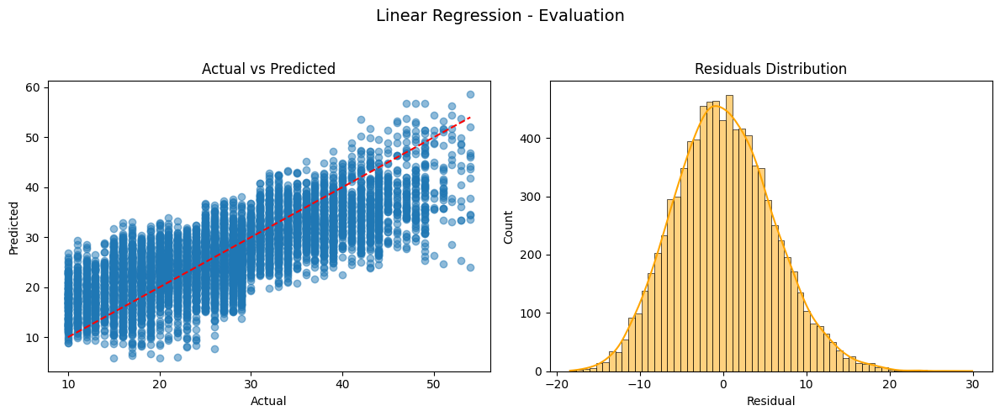

Tuning model: Ridge
  Best params: {'alpha': 0.01}


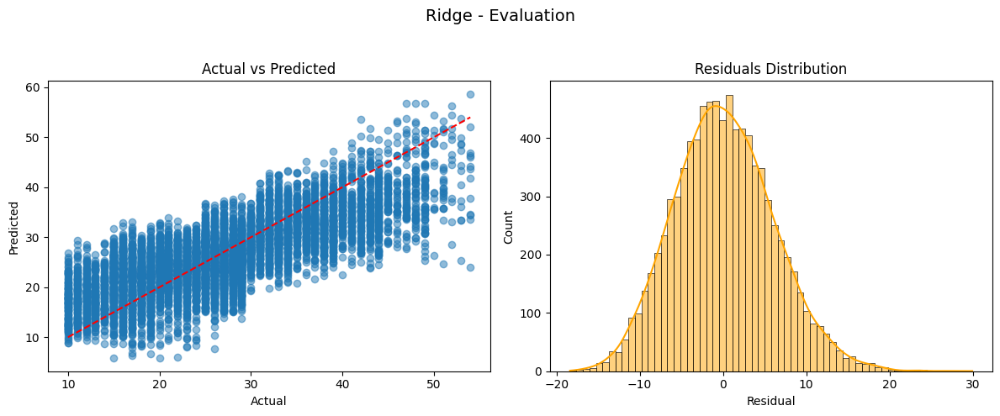

Tuning model: Lasso
  Best params: {'alpha': 0.01}


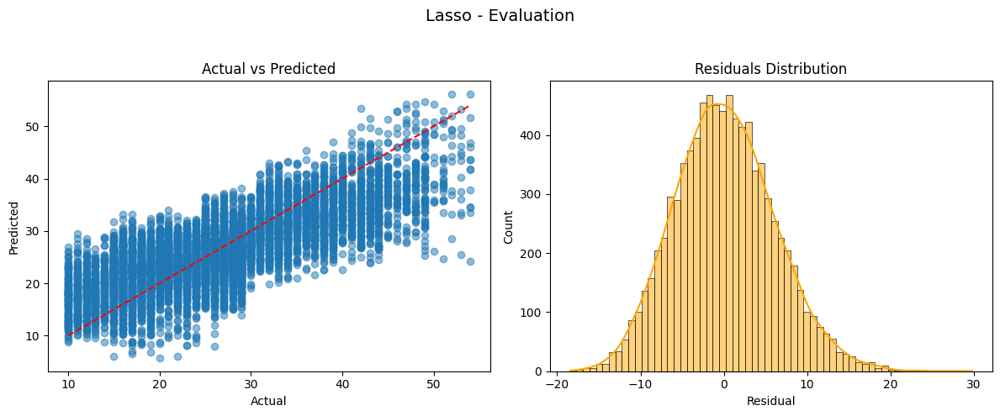

Tuning model: Decision Tree
  Best params: {'max_depth': 10, 'min_samples_split': 10}


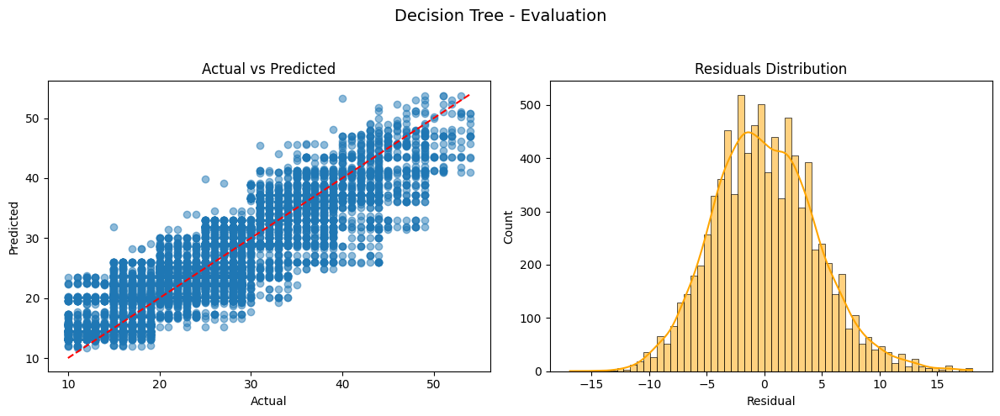

Tuning model: Random Forest
  Best params: {'max_depth': None, 'n_estimators': 200}


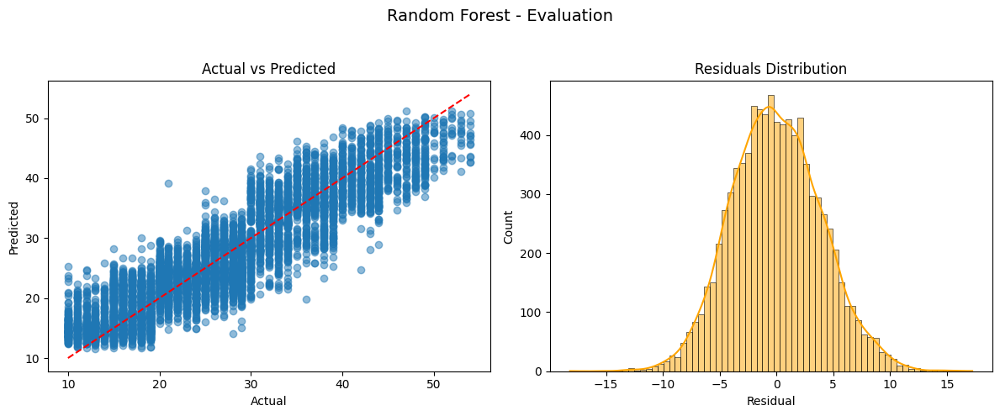

Tuning model: Gradient Boosting
  Best params: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200}


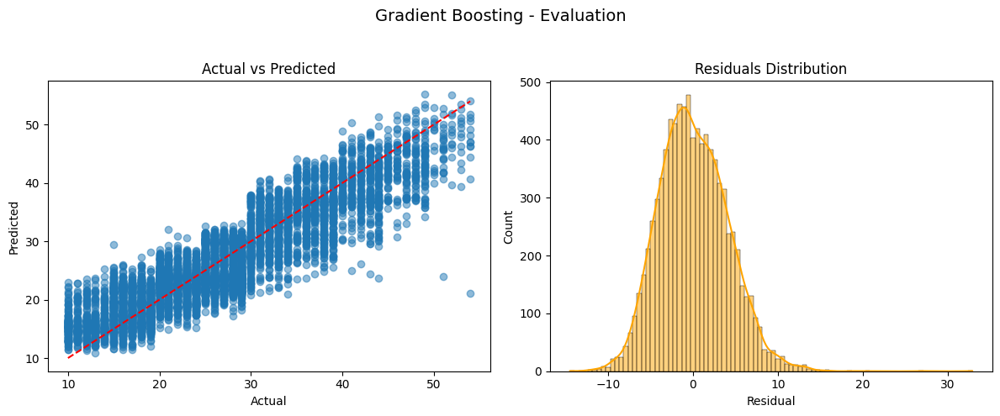

Tuning model: XGBoost
  Best params: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200}


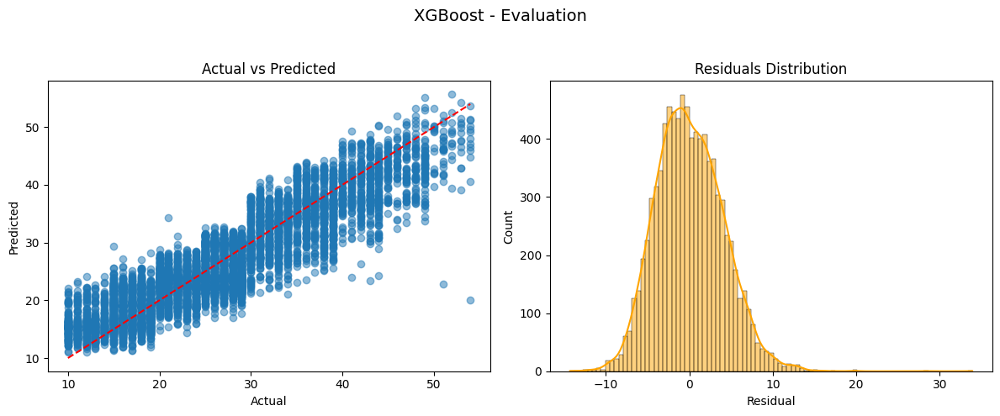

Tuning model: LightGBM
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002572 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 887
[LightGBM] [Info] Number of data points in the train set: 26555, number of used features: 31
[LightGBM] [Info] Start training from score 26.361137
  Best params: {'learning_rate': 0.1, 'max_depth': -1, 'n_estimators': 200}


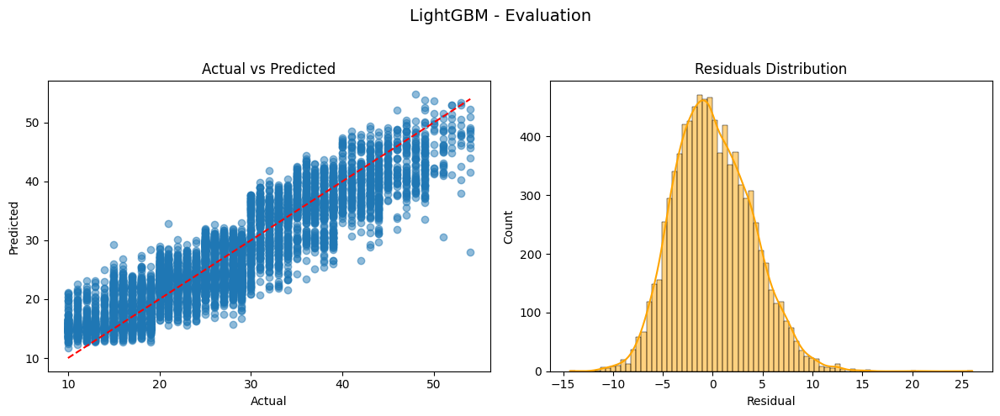

Tuning model: CatBoost
  Best params: {'depth': 7, 'iterations': 200, 'learning_rate': 0.1}


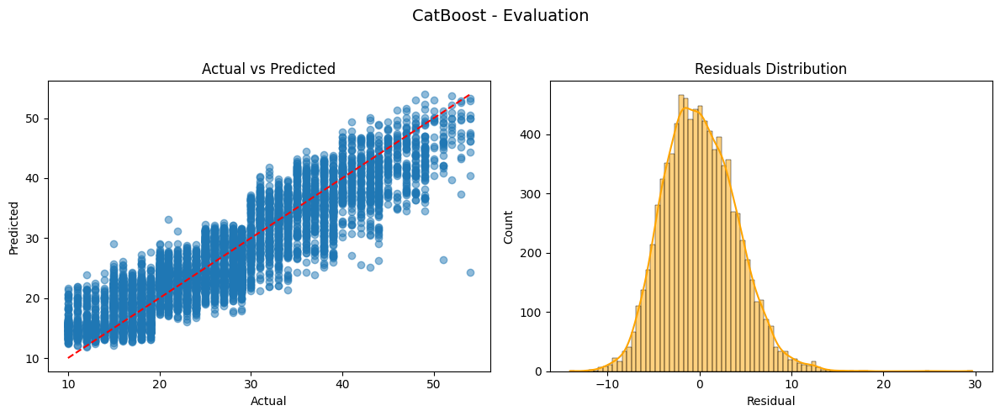

Tuning model: MLP Regressor
  Best params: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (100, 50)}


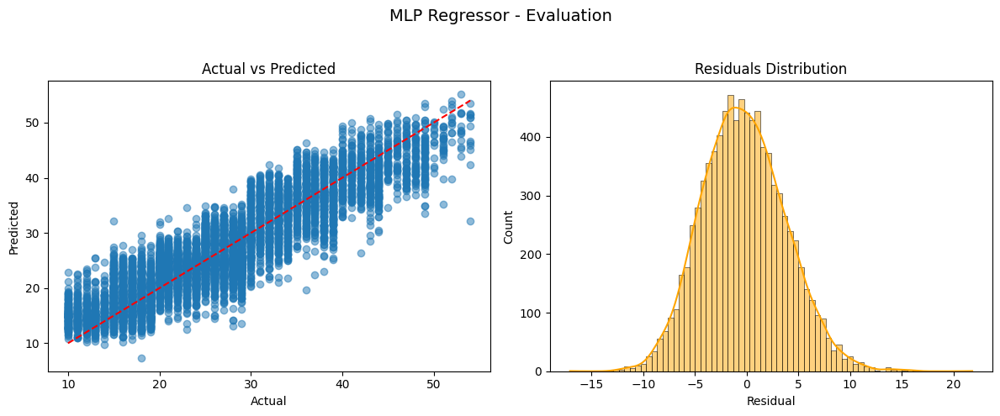

,Model,RMSE,MAE,MAPE (%),R² Score
0,Linear Regression,5.98,4.77,21.04,0.59
1,Ridge,5.98,4.77,21.04,0.59
2,Lasso,5.99,4.77,21.05,0.59
3,Decision Tree,4.51,3.59,15.51,0.77
4,Random Forest,3.95,3.16,13.71,0.82
5,Gradient Boosting,4.03,3.22,13.97,0.82
6,XGBoost,4.01,3.21,13.91,0.82
7,LightGBM,3.87,3.11,13.45,0.83
8,CatBoost,3.92,3.14,13.59,0.82
9,MLP Regressor,4.03,3.23,14.04,0.81


In [80]:
# Hyperparameter grids
param_grids = {
    "Linear Regression": {},
    "Ridge": {"alpha": [0.01, 0.1, 1.0, 10.0]},
    "Lasso": {"alpha": [0.01, 0.1, 1.0, 10.0]},
    "Decision Tree": {"max_depth": [3, 5, 10, None], "min_samples_split": [2, 5, 10]},
    "Random Forest": {"n_estimators": [100, 200], "max_depth": [5, 10, None]},
    "Gradient Boosting": {"n_estimators": [100, 200], "learning_rate": [0.01, 0.1], "max_depth": [3, 5]},
    "XGBoost": {"n_estimators": [100, 200], "learning_rate": [0.01, 0.1], "max_depth": [3, 5]},
    "LightGBM": {"n_estimators": [100, 200], "learning_rate": [0.01, 0.1], "max_depth": [3, 5, -1]},
    "CatBoost": {"iterations": [100, 200], "learning_rate": [0.01, 0.1], "depth": [3, 5, 7]},
    "MLP Regressor": {"hidden_layer_sizes": [(50,), (100,), (100, 50)], "activation": ['relu', 'tanh'], "alpha": [0.0001, 0.001]}
}

results_hyperparameter = []

# GridSearch + Evaluation
for name, model in models.items():
    print(f"Tuning model: {name}")

    param_grid = param_grids.get(name, {})

    if param_grid:  # ada parameter yang ingin di-grid search
        grid = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1)
        grid.fit(X_train, y_train)
        best_model = grid.best_estimator_
        print(f"  Best params: {grid.best_params_}")
    else:  # tidak ada parameter untuk dituning
        best_model = model
        best_model.fit(X_train, y_train)

    y_pred = best_model.predict(X_test)

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

    results_hyperparameter.append({
        "Model": name,
        "RMSE": rmse,
        "MAE": mae,
        "MAPE (%)": mape,
        "R² Score": r2
    })

    # Visualisasi
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(f"{name} - Evaluation", fontsize=14)

    axs[0].scatter(y_test, y_pred, alpha=0.5)
    axs[0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
    axs[0].set_xlabel("Actual")
    axs[0].set_ylabel("Predicted")
    axs[0].set_title("Actual vs Predicted")

    residuals = y_test - y_pred
    sns.histplot(residuals, kde=True, ax=axs[1], color='orange')
    axs[1].set_title("Residuals Distribution")
    axs[1].set_xlabel("Residual")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Hasil akhir
results_hyperparameter = pd.DataFrame(results_hyperparameter)
results_hyperparameter = results_hyperparameter.round(2)
results_hyperparameter

In [81]:
# Hasil akhir
results_hyperparameter = pd.DataFrame(results_hyperparameter).sort_values("MAPE (%)")
results_hyperparameter = results_hyperparameter.round(2)
results_hyperparameter

,Model,RMSE,MAE,MAPE (%),R² Score
7,LightGBM,3.87,3.11,13.45,0.83
8,CatBoost,3.92,3.14,13.59,0.82
4,Random Forest,3.95,3.16,13.71,0.82
6,XGBoost,4.01,3.21,13.91,0.82
5,Gradient Boosting,4.03,3.22,13.97,0.82
9,MLP Regressor,4.03,3.23,14.04,0.81
3,Decision Tree,4.51,3.59,15.51,0.77
0,Linear Regression,5.98,4.77,21.04,0.59
1,Ridge,5.98,4.77,21.04,0.59
2,Lasso,5.99,4.77,21.05,0.59


In [82]:
# Model dengan MAPE terkecil dijadikan model terbaik
best_model_name_hyperp = results_hyperparameter.sort_values("MAPE (%)").iloc[0]["Model"]
best_model_hyperp = models[best_model_name_hyperp]

print(f"Model terbaik berdasarkan MAPE: {best_model_name_hyperp}")

Model terbaik berdasarkan MAPE: LightGBM


## **Model Diagnostic**

### Baseline

In [83]:
# Membuat explainer
explainer = dx.Explainer(best_model, X_test, y_test, label=best_model_name)

Preparation of a new explainer is initiated

  -> data              : 8852 rows 31 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 8852 values
  -> model_class       : sklearn.neural_network._multilayer_perceptron.MLPRegressor (default)
  -> label             : CatBoost
  -> predict function  : <function yhat_default at 0x0000025F97DF4360> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 7.32, mean = 26.5, max = 55.2
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -17.1, mean = -0.255, max = 21.8
  -> model_info        : package sklearn

A new explainer has been created!


In [84]:
# Variable importance
explainer.model_parts().plot()

In [85]:
# Partial dependence plot (PDP)
explainer.model_profile().plot()

Calculating ceteris paribus: 100%|██████████| 31/31 [00:04<00:00,  6.94it/s]


In [86]:
# Performance plot
explainer.model_performance().plot()

In [87]:
# Residual diagnostic
explainer.model_diagnostics().plot()

### Hyperparameter

In [88]:
# Membuat explainer
explainer_hyperp = dx.Explainer(best_model_hyperp, X_test, y_test, label=best_model_name)

Preparation of a new explainer is initiated

  -> data              : 8852 rows 31 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 8852 values
  -> model_class       : lightgbm.sklearn.LGBMRegressor (default)
  -> label             : CatBoost
  -> predict function  : <function yhat_default at 0x0000025F97DF4360> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 12.7, mean = 26.2, max = 53.8
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -14.2, mean = 0.0769, max = 26.0
  -> model_info        : package lightgbm

A new explainer has been created!


In [89]:
# Variable importance
explainer_hyperp.model_parts().plot()

In [90]:
# Partial dependence plot (PDP)
explainer_hyperp.model_profile().plot()

Calculating ceteris paribus:   0%|          | 0/31 [00:00<?, ?it/s]

Calculating ceteris paribus: 100%|██████████| 31/31 [00:01<00:00, 26.37it/s]


In [91]:
# Performance plot
explainer_hyperp.model_performance().plot()

In [92]:
# Residual diagnostic
explainer_hyperp.model_diagnostics().plot()

## end. Thank You!